## Brighter-Fatter PSFs

Originally written by Alex Broughton



In [1]:
! eups list -s | grep lsst_distrib

lsst_distrib          g4213664e8e+995cec829e 	w_2023_29 setup


In [2]:
# Imports
import sys
import math
sys.path.append('/sdf/home/a/abrought/bin')
from SpotAnalysis import *
import matplotlib.pyplot as plt
from IPython.display import display, Latex
from matplotlib.pyplot import cm
import matplotlib
matplotlib.rcParams.update({'font.size': 15})
import warnings
warnings.filterwarnings('ignore')
from math import log10, floor

def nsigfig(num, sig=3):
    return np.format_float_positional(num, precision=sig, unique=False, fractional=False, trim='k')

def format_number(num, sig=3):
    return np.format_float_scientific(num, precision=sig, unique=False, trim='k')


# def numformatter():
#     s = self.fmt % x
#     decimal_point = '.'
#     positive_sign = '+'
#     tup = s.split('e')
#     significand = tup[0].rstrip(decimal_point)
#     significand = nsigfig(significand)
#     sign = tup[1][0].replace(positive_sign, '')
#     exponent = tup[1][1:].lstrip('0')
#     if exponent:
#         exponent = '10^{%s%s}' % (sign, exponent)
#     if significand and exponent:
#         s =  r'%s{\times}%s' % (significand, exponent)
#     else:
#         s =  r'%s%s' % (significand, exponent)
#     return "${}$" #.format(s)

# class MathTextSciFormatter(mticker.Formatter):
#     def __init__(self, fmt="%1.2e"):
#         self.fmt = fmt
#     def __call__(self, x, pos=None):
#         s = self.fmt % x
#         decimal_point = '.'
#         positive_sign = '+'
#         tup = s.split('e')
#         significand = tup[0].rstrip(decimal_point)
#         significand = nsigfig(significand)
#         sign = tup[1][0].replace(positive_sign, '')
#         exponent = tup[1][1:].lstrip('0')
#         if exponent:
#             exponent = '10^{%s%s}' % (sign, exponent)
#         if significand and exponent:
#             s =  r'%s{\times}%s' % (significand, exponent)
#         else:
#             s =  r'%s%s' % (significand, exponent)
#         return "${}$" #.format(s)

def getUniqueIndices(records_array):

    vals, indxs = np.unique(records_array, return_index=True)

    return indxs

def plot_spots(data,data2, t0, xkey, ykey, fitrange, figsize, fontsize, xlabel, ylabel, ylabel2, xlim, ylim, sensor, detector, saveto):
    
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=figsize, facecolor="white")
        
    ax1.axhline(0.0, linestyle="--", color="k", linewidth=1, alpha=0.25)
    ax2.axhline(0.0, linestyle="--", color="k", linewidth=1, alpha=0.25)
    
    ptc_turnoffs, scti_turnoffs, pcti_turnoffs, moss, gains= getSensorData(sensor=sensor, detector=detector)
    ax1.axvspan(np.min(pcti_turnoffs), np.max(pcti_turnoffs), alpha=0.25, hatch='XX',color='gray', edgecolor="None", label = "pCTI TURNOFF")
    ax1.axvspan(np.min(ptc_turnoffs), np.max(ptc_turnoffs), alpha=0.25, hatch='O', color='gray', edgecolor="None", label = "PTC TURNOFF")
    ax1.axvspan(np.min(scti_turnoffs), np.max(scti_turnoffs), alpha=0.25, hatch='.', color='gray', edgecolor="None", label = "sCTI TURNOFF")
    ax1.axvspan(np.min(moss), np.max(moss), alpha=0.25, color='gray', hatch='*', edgecolor="None", label = "MAX OBSERVED SIGNAL")
    ax2.axvspan(np.min(pcti_turnoffs), np.max(pcti_turnoffs), alpha=0.25, hatch='XX', edgecolor="None", color='gray') #, label = "pCTI TURNOFF")
    ax2.axvspan(np.min(ptc_turnoffs), np.max(ptc_turnoffs), alpha=0.25, hatch='O', edgecolor="None", color='gray') #, label = "PTC TURNOFF")
    ax2.axvspan(np.min(scti_turnoffs), np.max(scti_turnoffs), alpha=0.25, hatch='.', edgecolor="None", color='gray') #, label = "sCTI TURNOFF")
    ax2.axvspan(np.min(moss), np.max(moss), alpha=0.25, hatch='*', edgecolor="None", color='gray') #, label = "MAX OBSERVED SIGNAL")
    
    if ykey=="Iyy":
        ax1.fill_between([0,2.0e5], y1=[-0.01045, -0.01045], y2=[0.01045, 0.01045], color='#4c8bf5', edgecolor="None",alpha=0.25, label=r'$|\delta I_{yy}|\;/\;\bar{I}_{yy, 15s} < 10^{-3}$')
        ax2.fill_between([0,2.0e5], y1=[-0.01045, -0.01045], y2=[0.01045, 0.01045], color='#4c8bf5', edgecolor="None", alpha=0.25)
    elif ykey=="Ixx":
        ax1.fill_between([0,2.0e5], y1=[-0.00945, -0.00945], y2=[0.00945, 0.00945], color='#4c8bf5', edgecolor="None", alpha=0.25, label=r'|$\delta I_{xx}|\;/\;\bar{I}_{xx, 15s} < 10^{-3}$')
        ax2.fill_between([0,2.0e5], y1=[-0.00945, -0.00945], y2=[0.00945, 0.00945], color='#4c8bf5', edgecolor="None", alpha=0.25)
    elif ykey=="Ixy":
        ax1.fill_between([0,2.0e5], y1=[-0.00056, -0.00056], y2=[0.00056, 0.00056], color='#4c8bf5', edgecolor="None", alpha=0.25, label=r'$|\delta I_{xy}|\;/\;\bar{I}_{xy, 15s} < 10^{-3}$')
        ax2.fill_between([0,2.0e5], y1=[-0.00056, -0.00056], y2=[0.00056, 0.00056], color='#4c8bf5', edgecolor="None", alpha=0.25)

    def reject_outliers(d, m=5):
        #print("d shape", d.shape)
        m=3
        return (np.abs(d - np.mean(d)) <= m * np.std(d))
    
    # Get the reference spots
    ref_data = data[data['exptime'] == t0]
    ref_spots = []
    for exp in ref_data:
        ref_spots.extend(['%04d' % n for n in exp['spot_indices']])
    ref_spots = np.unique(ref_spots)
    
    ref_spots_dict = dict()
    ref_spots_dict_err = dict()
    for spot in ref_spots:
        ref_spots_dict[spot] = []
        for exp in ref_data:
            if spot in ['%04d' % n for n in exp['spot_indices']]:
                this_spot = np.asarray(['%04d' % n for n in exp['spot_indices']]) == spot
                ref_spots_dict[spot].append(exp[ykey][this_spot][0])

    for spot in ref_spots_dict.keys():
        mean = np.mean(ref_spots_dict[spot])
        std  = np.std(ref_spots_dict[spot])
        ref_spots_dict_err[spot] = std / np.sqrt(len(ref_spots_dict[spot]))
        ref_spots_dict[spot] = mean
    
    # Get data for all spots
    ys = []
    xs = []
    es = []
    for exp in data:
        spots_in_this_exp = np.asarray(['%04d' % n for n in exp['spot_indices']])
        these_spots = np.intersect1d(ref_spots, spots_in_this_exp)
        
        #print("Ref Spots:\n", ref_spots, "\nSpots:\n", spots_in_this_exp, "\n")
        for spot in these_spots:
            this_spot = (spots_in_this_exp == spot)
            if exp['channels'][this_spot] == 'C07':
                continue
            
            xs.append(exp[xkey][this_spot])
            ys.append(exp[ykey][this_spot] - ref_spots_dict[spot])
            es.append(exp['exptime'])
    
    xs = np.asarray(xs)
    ys = np.asarray(ys)
    es = np.asarray(es)

  
            
    # Plot
    
    matplotlib.rcParams.update({'font.size': 15})
    
    exptimes = np.unique(data['exptime'])
    normalize = matplotlib.colors.Normalize(vmin=np.min(exptimes), vmax=np.max(exptimes))
    
    fitx = []
    fity = []
    
    for i, e in enumerate(exptimes):
        select = (es==e)
        m = 3
        good = reject_outliers(xs[select], m=3)[:,0] * reject_outliers(ys[select], m=3)[:,0]

        n = len(es[select][good])
        
        xerr = np.std(xs[select][good]) #/np.sqrt(n)
        yerr = np.std(ys[select][good]) #/np.sqrt(n)
        
        if e >= fitrange[0] and e <= fitrange[1]:
            fitx.append(np.mean(xs[select][good]))
            fity.append(np.mean(ys[select][good]))

        #c=es[select][good]
        im1 = ax1.scatter(xs[select][good], ys[select][good], c="#4c8bf5", cmap='turbo', norm=normalize, s=.5, alpha=0.1)
        ax1.errorbar(np.mean(xs[select][good]), np.mean(ys[select][good]), 
                     xerr=xerr, yerr=yerr,
                     fmt="o", mfc="k",color="k", mec="k",ecolor="k",alpha=1,
                     ms=5.,mew=0., capsize=3.5, capthick=0.5, elinewidth=0.5)
    
    fitx=np.asarray(fitx)
    fity=np.asarray(fity)
    if np.any(np.isnan(fitx)) or np.any(np.isnan(fity)):
        if np.all(np.isnan(fitx)) or np.all(np.isnan(fity)):
            print("CANNOT FIT DATA")
            return
        else:
            these = np.logical_not(np.logical_or(np.isnan(fitx), np.isnan(fity)))     
            these = np.array(these)
            fitx=fitx[these]
            fity=fity[these]
            
    (m, b), V  = np.polyfit(fitx, fity, 1, cov=True)
    slope = m #*10000
    ax1_slope_err = np.sqrt(V[0][0]) #* 10000
    print("$",format_number(slope), "$ & $", format_number(ax1_slope_err),"$")
    #ax1.text(slopeLoc[0],slopeLoc[1], )
    
    label="{}".format(str(nsigfig(slope))) +" $\mathrm{px}^2 / \mathrm{el}$"
    if ykey=='Ixx' or ykey=='Iyy':
        label="{}".format(str(nsigfig(slope*1e6))) + r"$\times 10^{-6} \mathrm{px}^2 / \mathrm{el}$"
    elif ykey=='Ixy':
        label="{}".format(str(nsigfig(slope*1e8))) + r"$\times 10^{-8} \mathrm{px}^2 / \mathrm{el}$"
        
    ax1.plot(np.linspace(np.min(fitx),np.max(fitx), 1000), m*np.linspace(np.min(fitx),np.max(fitx), 1000) + b, color="black" , linewidth=1, linestyle="--", label=label)
    
    ax1.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax1.set_xlim(xlim)
    ax1.set_ylim(ylim)
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel)

    uncorrected_slope = slope
    ################################################################################################
    
    # Get the reference spots
    ref_data = data2[data2['exptime'] == t0]
    ref_spots = []
    for exp in ref_data:
        ref_spots.extend(['%04d' % n for n in exp['spot_indices']])
    ref_spots = np.unique(ref_spots)
    
    ref_spots_dict = dict()
    ref_spots_dict_err = dict()
    for spot in ref_spots:
        ref_spots_dict[spot] = []
        for exp in ref_data:
            if spot in ['%04d' % n for n in exp['spot_indices']]:
                this_spot = np.asarray(['%04d' % n for n in exp['spot_indices']]) == spot
                ref_spots_dict[spot].append(exp[ykey][this_spot][0])

    for spot in ref_spots_dict.keys():
        mean = np.mean(ref_spots_dict[spot])
        std  = np.std(ref_spots_dict[spot])
        ref_spots_dict_err[spot] = std / np.sqrt(len(ref_spots_dict[spot]))
        ref_spots_dict[spot] = mean
    
    # Get data for all spots
    ys = []
    xs = []
    es = []
    for exp in data2:
        spots_in_this_exp = np.asarray(['%04d' % n for n in exp['spot_indices']])
        these_spots = np.intersect1d(ref_spots, spots_in_this_exp)

        for spot in these_spots:
            this_spot = (spots_in_this_exp == spot)

            if exp['channels'][this_spot] == 'C07':
                continue
            
            xs.append(exp[xkey][this_spot])
            ys.append(exp[ykey][this_spot] - ref_spots_dict[spot])
            es.append(exp['exptime'])
    
    xs = np.asarray(xs)
    ys = np.asarray(ys)
    es = np.asarray(es)
    
    #print(xs[(xs>1.6e5)*(xs<1.63e5)])
  
            
    # Plot
    
    matplotlib.rcParams.update({'font.size': 15})
    
    exptimes = np.unique(data2['exptime'])
    normalize = matplotlib.colors.Normalize(vmin=np.min(exptimes), vmax=np.max(exptimes))
    
    fitx = []
    fity = []
    
    for i, e in enumerate(exptimes):
        select = (es==e)
        m = 3
        good = reject_outliers(xs[select], m=3)[:,0] * reject_outliers(ys[select], m=3)[:,0]

        n = len(es[select][good])
        
        xerr = np.std(xs[select][good]) #/np.sqrt(n)
        yerr = np.std(ys[select][good]) #/np.sqrt(n)
        
        if e >= fitrange[0] and e <= fitrange[1]:
            fitx.append(np.mean(xs[select][good]))
            fity.append(np.mean(ys[select][good]))

        #c=es[select][good]
        im2 = ax2.scatter(xs[select][good], ys[select][good], c="#4c8bf5", cmap='turbo', norm=normalize, s=.5, alpha=0.1)
        print("yerrs:", yerr/np.sqrt(3200))
        ax2.errorbar(np.mean(xs[select][good]), np.mean(ys[select][good]), 
                     xerr=xerr, yerr=yerr,
                     fmt="o", mfc="k",color="k", mec="k",ecolor="k",alpha=1,
                     ms=5.,mew=0., capsize=3.5, capthick=0.5, elinewidth=0.5)
    
    fitx=np.asarray(fitx)
    fity=np.asarray(fity)
    if np.any(np.isnan(fitx)) or np.any(np.isnan(fity)):
        if np.all(np.isnan(fitx)) or np.all(np.isnan(fity)):
            print("CANNOT FIT DATA")
            return
        else:
            these = np.logical_not(np.logical_or(np.isnan(fitx), np.isnan(fity)))     
            these = np.array(these)
            fitx=fitx[these]
            fity=fity[these]
    
    (m, b), V  = np.polyfit(fitx, fity, 1, cov=True)
    slope = m
    ax2_slope_err = np.sqrt(V[0][0])
    print("$",format_number(slope), "$ & $", format_number(ax2_slope_err),"$")
    #ax2.text(slopeLoc[0],slopeLoc[1], "{}".format(str(round(slope,4))) +" px$^2$ / 10k $e^{-}$")
    label="{}".format(str(nsigfig(slope))) +" $\mathrm{px}^2 / \mathrm{el}$"
    if ykey=='Ixx':
        label="{}".format(str(nsigfig(slope*1e8))) + r"$\times 10^{-8} \mathrm{px}^2 / \mathrm{el}$"
    elif ykey=='Iyy':
        label="{}".format(str(nsigfig(slope*1e7))) + r"$\times 10^{-7} \mathrm{px}^2 / \mathrm{el}$"
    elif ykey=='Ixy':
        label="{}".format(str(nsigfig(slope*1e8))) + r"$\times 10^{-8} \mathrm{px}^2 / \mathrm{el}$"
        
    ax2.plot(np.linspace(np.min(fitx),np.max(fitx), 1000), m*np.linspace(np.min(fitx),np.max(fitx), 1000) + b, color="black" , linewidth=1,linestyle="--", label=label)
    
    ax2.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax2.set_xlim(xlim)
    ax2.set_ylim(ylim)
    ax1.legend(loc=2, frameon=False)
    ax2.legend(loc=2, frameon=False)
    #plt.colorbar(im1,ax=ax1, label="Exposure Time [s]", ticks=exptimes)
    #plt.colorbar(im2,ax=ax2, label="Exposure Time [s]", ticks=exptimes)
    ax2.set_xlabel(xlabel)
    ax2.set_ylabel(ylabel2)
    
    if ykey=='Ixy':
        ax1.set_yticks([-0.1,0,0.1,0.2])
        ax2.set_yticks([-0.1,0,0.1,0.2])
    
    plt.savefig(saveto, bbox_inches="tight")
    corrected_slope = slope
    print(ykey, (1. - (corrected_slope/uncorrected_slope))*100)
    return xs,ys,es
    
    

# R03-S12

FINAL (Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ 1.119e-07 $ & $ 2.569e-08 $
Ixx 93.76850238310799
$ 2.150e-06 $ & $ 5.336e-09 $
$ 3.386e-07 $ & $ 5.470e-09 $
Iyy 84.25446455222986
$ 6.814e-08 $ & $ 7.587e-09 $
$ 3.880e-08 $ & $ 7.226e-09 $
Ixy 43.06653287707468


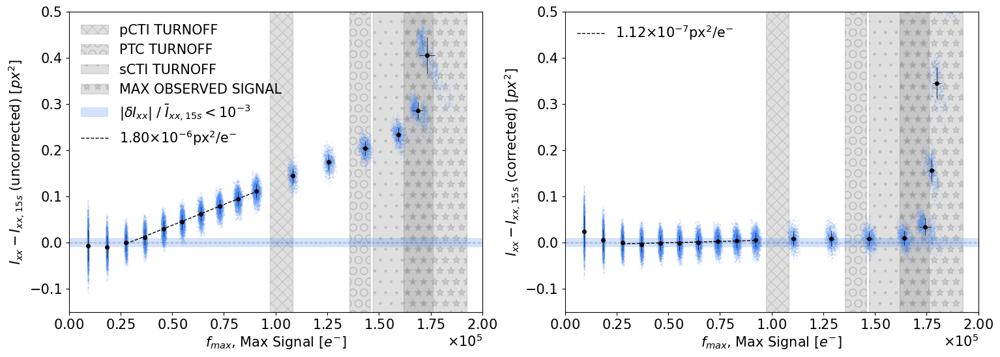

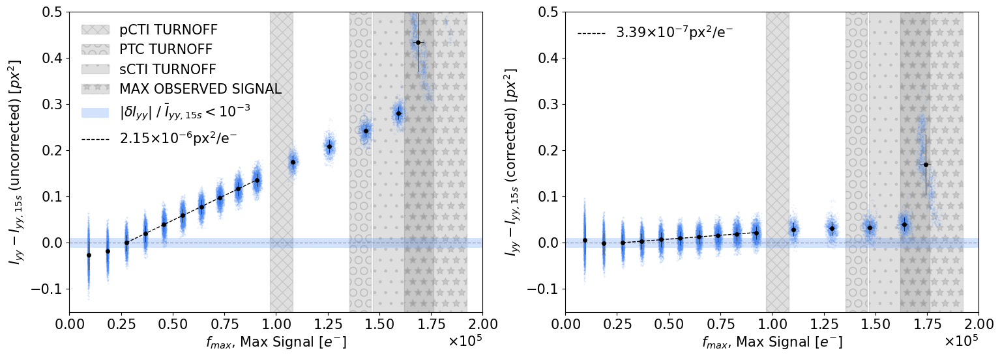

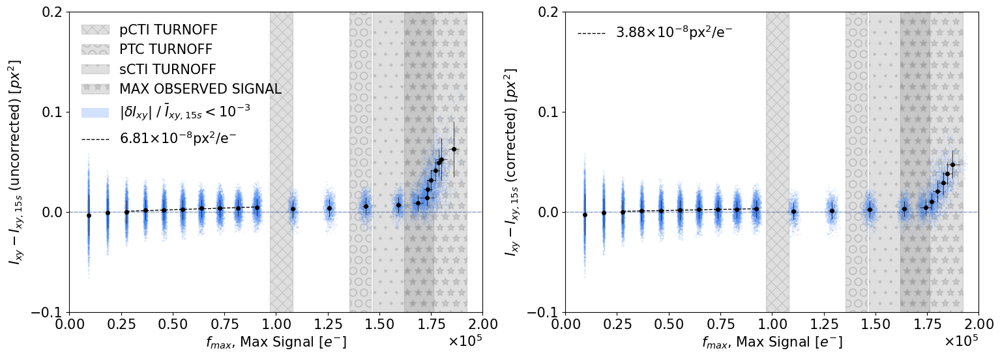

In [3]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-19T10:46:31_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T12:17:07_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13247_R03_S12_2023-09-25T18:53:28_680nm_corrected.fluxConserving.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-25T23:59:00_680nm_corrected.fluxConserving.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_fluxconservingcorrection.png")



FINAL (Non-Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
yerrs: 0.0006055055497166564
yerrs: 0.0004203050042483048
yerrs: 0.0003188706494112806
yerrs: 0.00031122233960537886
yerrs: 0.00029015676076401956
yerrs: 0.00028891477829125667
yerrs: 0.0002772614713448195
yerrs: 0.0002687847864158729
yerrs: 0.0002672675096660947
yerrs: 0.0002693503394016633
yerrs: 0.00028606666324398395
yerrs: 0.0002873508063731433
yerrs: 0.00027189171143638465
yerrs: 0.0002797278854126083
yerrs: 0.00033663790111093016
yerrs: 0.00039088736318404504
yerrs: 0.0006311620185402982
yerrs: 0.0006436087992009078
yerrs: 0.0006443985714160158
yerrs: 0.0006712343293138601
yerrs: 0.00233739053968788
yerrs: nan
$ 7.985e-08 $ & $ 2.322e-08 $
Ixx 95.55373247287314
$ 2.150e-06 $ & $ 5.336e-09 $
yerrs: 0.0005563954558270989
yerrs: 0.0004056541480530072
yerrs: 0.0003189880786572106
yerrs: 0.0003022699085602733
yerrs: 0.0002837446191214336
yerrs: 0.0002703554635429278
yerrs: 0.00026393374555988834
yerrs: 0.00025269941843143875
yerrs: 0.0002647655209074957


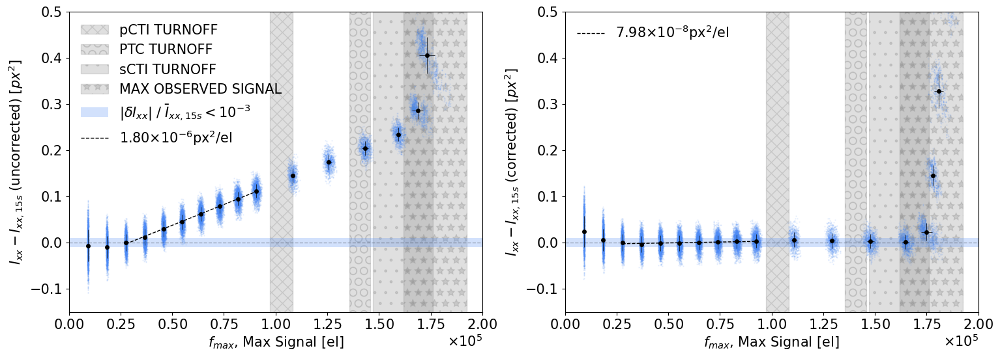

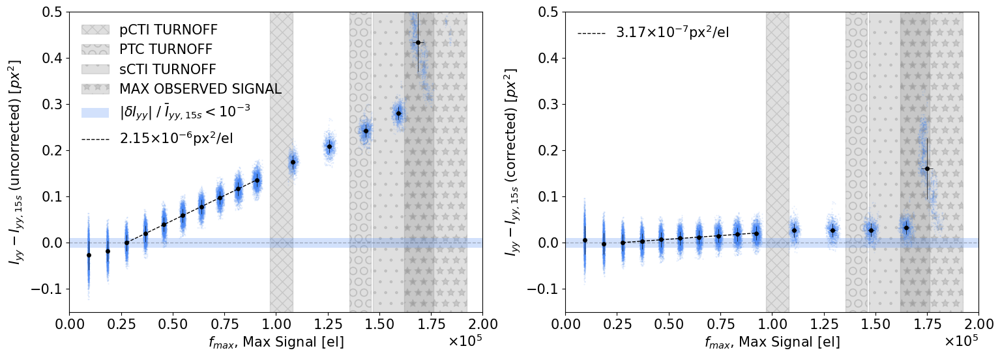

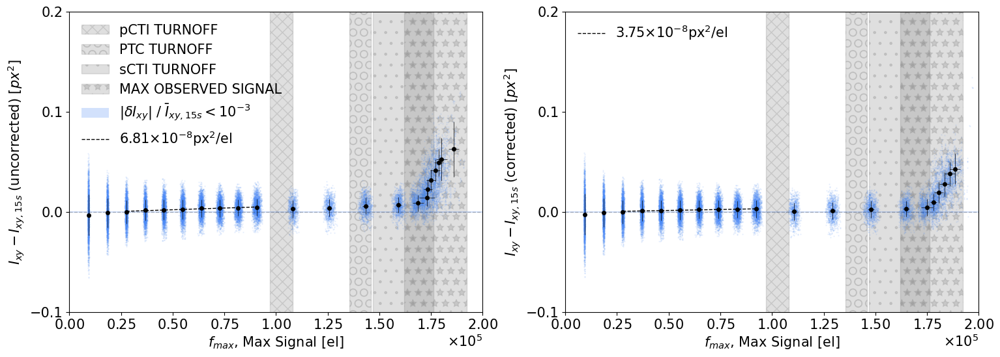

In [3]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-10-09/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-10-27T13:58:28_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-10-27T12:46:21_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13247_R03_S12_2023-10-28T13:59:49_680nm_corrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-10-28T12:58:27_680nm_corrected.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_nonfluxconservingcorrection.png")

plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_nonfluxconservingcorrection.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_nonfluxconservingcorrection.png")



FINAL Transposed $K_{ij}$ (Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ 1.770e-07 $ & $ 6.844e-08 $
Ixx 90.14598695915635
$ 2.150e-06 $ & $ 5.336e-09 $
$ 5.950e-07 $ & $ 8.255e-09 $
Iyy 72.33113012052932
$ 6.814e-08 $ & $ 7.587e-09 $
$ 8.985e-08 $ & $ 2.750e-08 $
Ixy -31.851547094926637


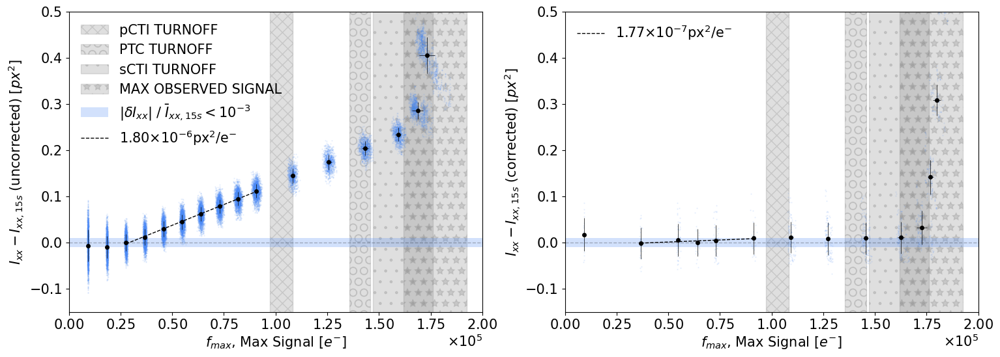

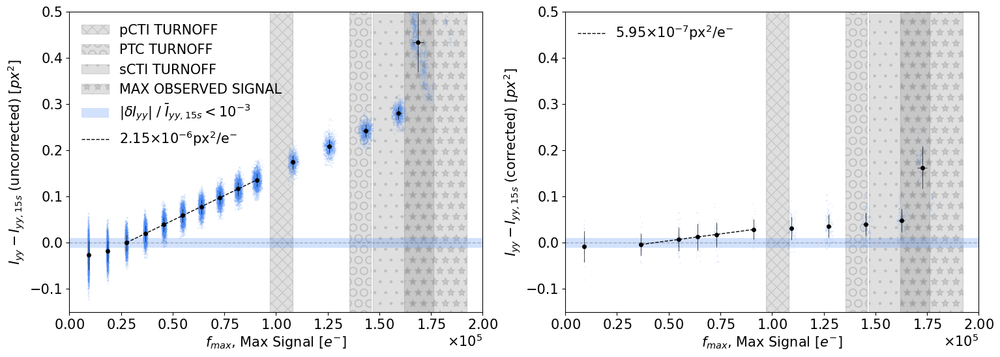

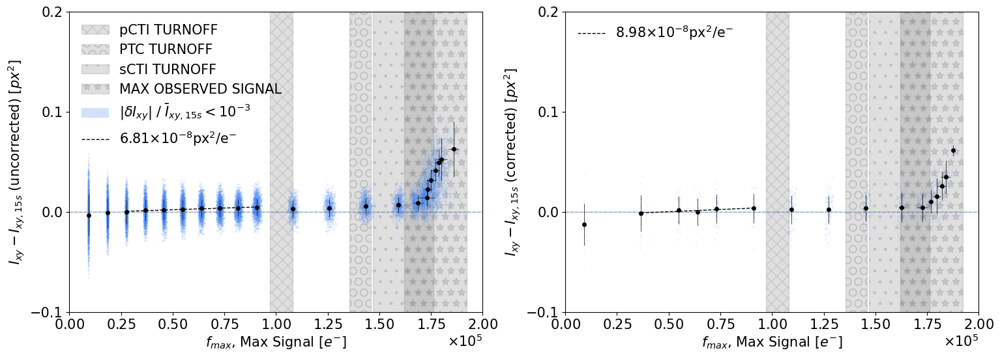

In [15]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-17T20:32:46_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-17T14:24:19_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13247_R03_S12_2023-09-18T15:11:08_680nm_corrected.fluxConserving.transposedK.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-18T14:27:09_680nm_corrected.fluxConserving.transposedK.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_fluxconservingcorrection_transposedK.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_fluxconservingcorrection_transposedK.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_fluxconservingcorrection_transposedK.png")



Transposed $K_{ij}$ (Non-Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ 2.491e-08 $ & $ 2.318e-08 $
Ixx 98.61260288932812
$ 2.150e-06 $ & $ 5.336e-09 $
$ 3.652e-07 $ & $ 7.594e-09 $
Iyy 83.01462160657607
$ 6.814e-08 $ & $ 7.587e-09 $
$ 3.750e-08 $ & $ 7.350e-09 $
Ixy 44.97582056968078


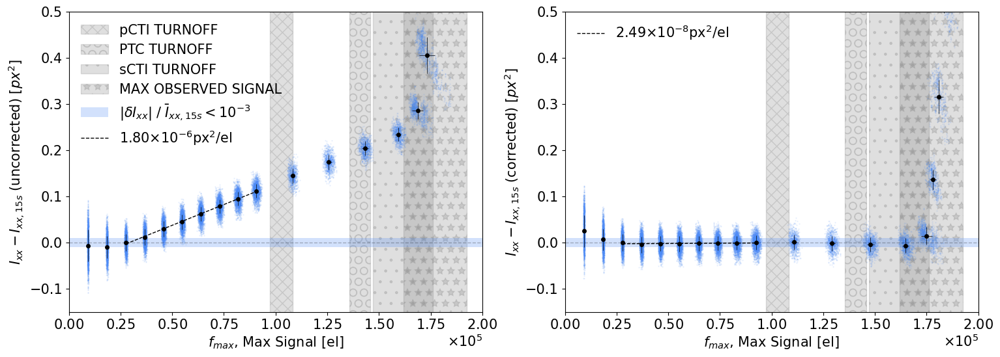

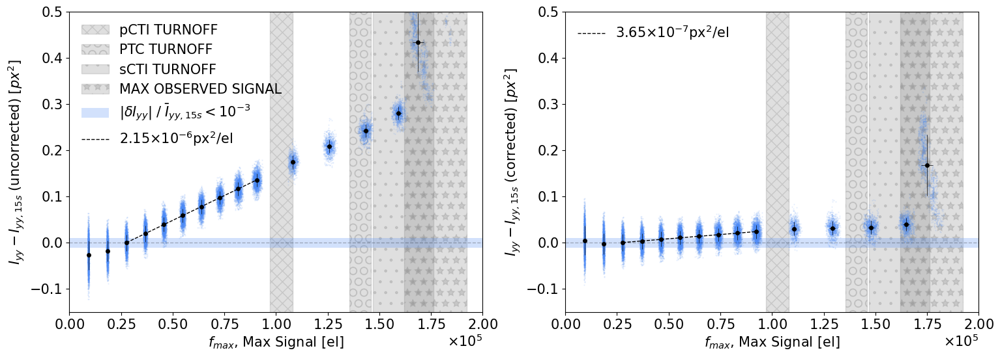

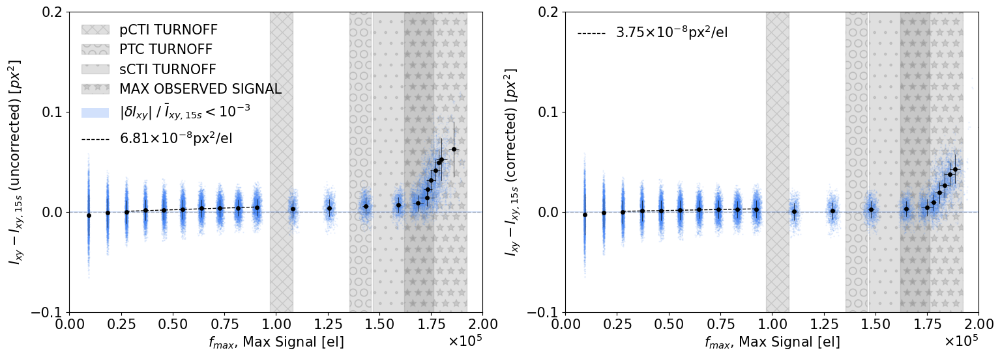

In [18]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-10-09/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-10-27T13:58:28_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-10-27T12:46:21_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13247_R03_S12_2023-10-28T04:54:57_680nm_corrected.transposedK.pkl", \
                             outdir + "data_13248_R03_S12_2023-10-28T03:28:34_680nm_corrected.transposedK.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_nonfluxconservingcorrection_transposedK.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_nonfluxconservingcorrection_transposedK.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_nonluxconservingcorrection_transposedK.png")



$a_{ij}$ (forceZeroSum Off) (Non-Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ 5.746e-07 $ & $ 2.444e-08 $
Ixx 68.00525057171305
$ 2.150e-06 $ & $ 5.336e-09 $
$ 9.373e-07 $ & $ 6.423e-09 $
Iyy 56.41031435815559
$ 6.814e-08 $ & $ 7.587e-09 $
$ 5.977e-08 $ & $ 7.401e-09 $
Ixy 12.291499529707162


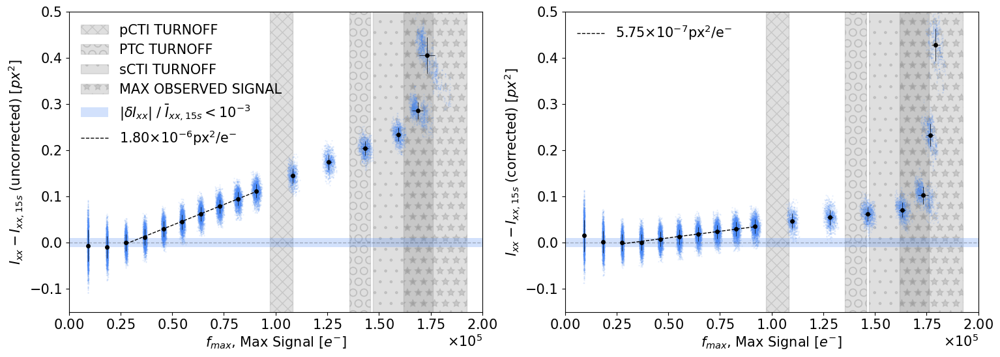

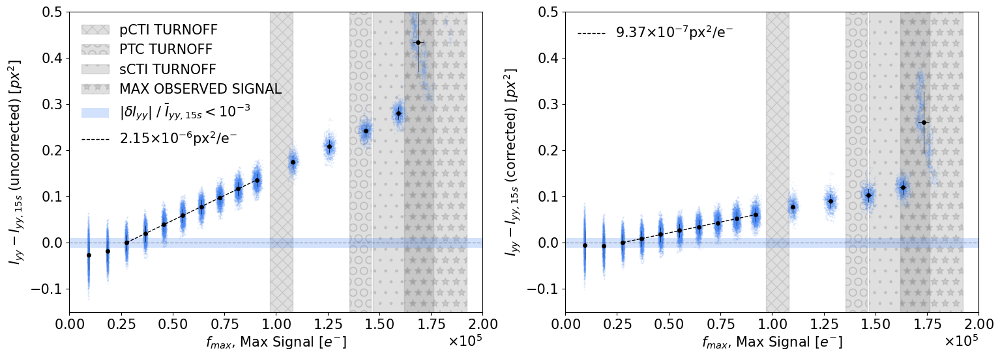

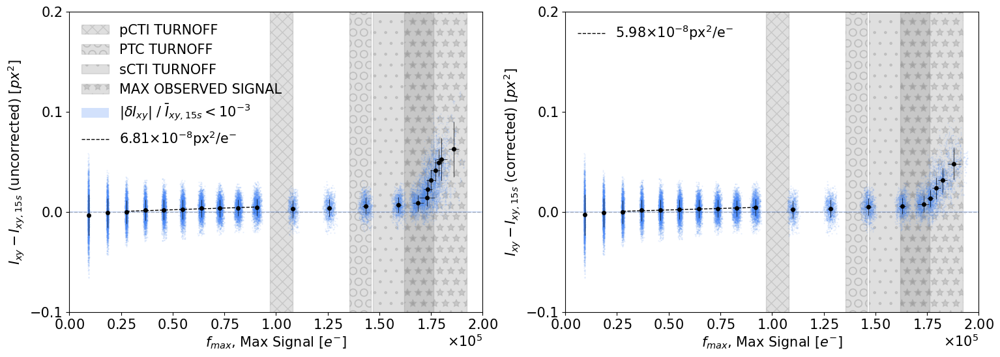

In [5]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-19T10:46:31_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T12:17:07_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13247_R03_S12_2023-09-19T11:40:38_680nm_corrected.amatrix.forceZeroSumOff.nonFluxConserving.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T18:48:10_680nm_corrected.amatrix.forceZeroSumOff.nonFluxConserving.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_amatrix_zerosumoff_nonfluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_amatrix_zerosumoff_nonfluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_amatrix_zerosumoff_nonfluxconservingcorrection.png")



$a_{ij}$ (forceZeroSum Off) (Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ 5.447e-07 $ & $ 2.649e-08 $
Ixx 69.6665473349582
$ 2.150e-06 $ & $ 5.336e-09 $
$ 8.945e-07 $ & $ 5.192e-09 $
Iyy 58.398007549248064
$ 6.814e-08 $ & $ 7.587e-09 $
$ 6.047e-08 $ & $ 7.247e-09 $
Ixy 11.267296680307481


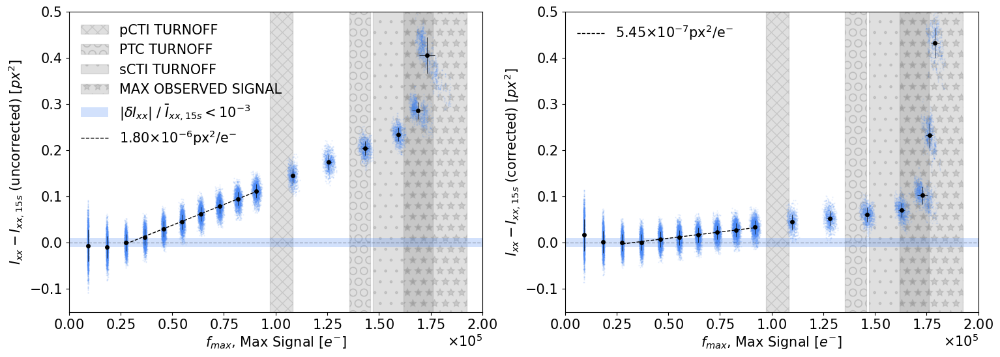

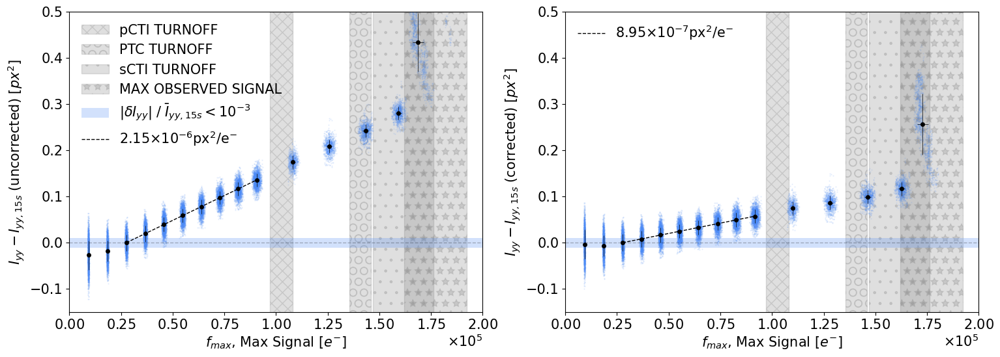

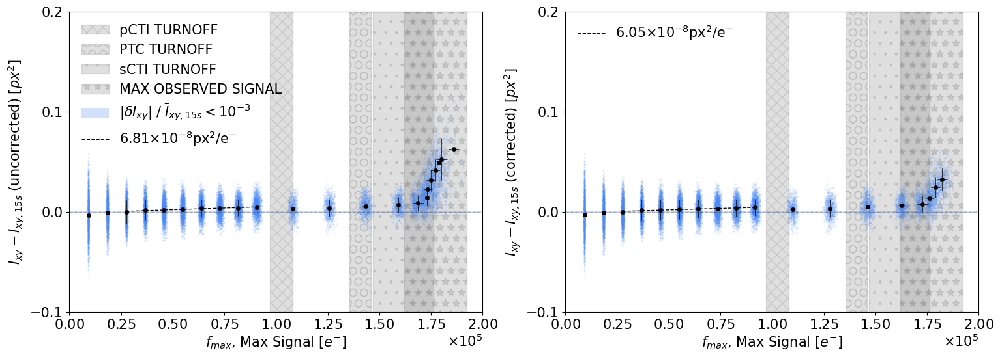

In [19]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-17T20:32:46_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-17T14:24:19_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-09-18T21:10:21_680nm_corrected.amatrix.forceZeroSummOff.fluxConserving.pkl", \
                             outdir + "data_13247_R03_S12_2023-09-18T02:29:57_680nm_corrected.amatrix.forceZeroSummOff.fluxConserving.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_amatrix_zerosumoff_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_amatrix_zerosumoff_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_amatrix_zerosumoff_fluxconservingcorrection.png")



$a_{ij}$ (Non-Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ -5.577e-07 $ & $ 2.192e-08 $
Ixx 131.05870660400393
$ 2.150e-06 $ & $ 5.336e-09 $
$ -2.762e-07 $ & $ 8.891e-09 $
Iyy 112.84371486321491
$ 6.814e-08 $ & $ 7.587e-09 $
$ 2.392e-08 $ & $ 7.297e-09 $
Ixy 64.89523618536603


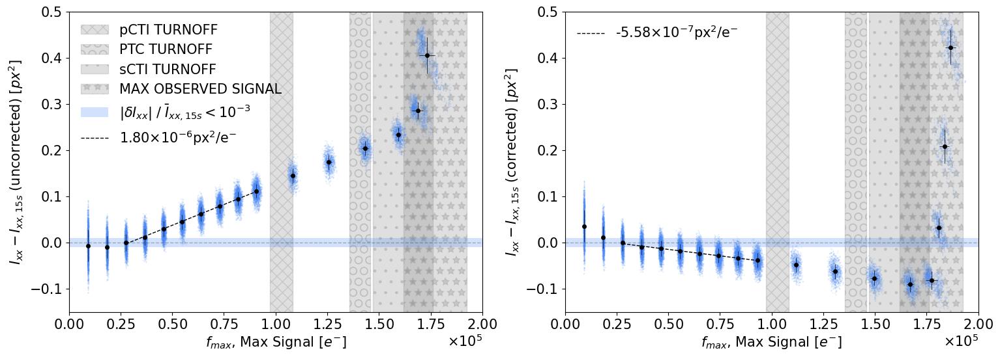

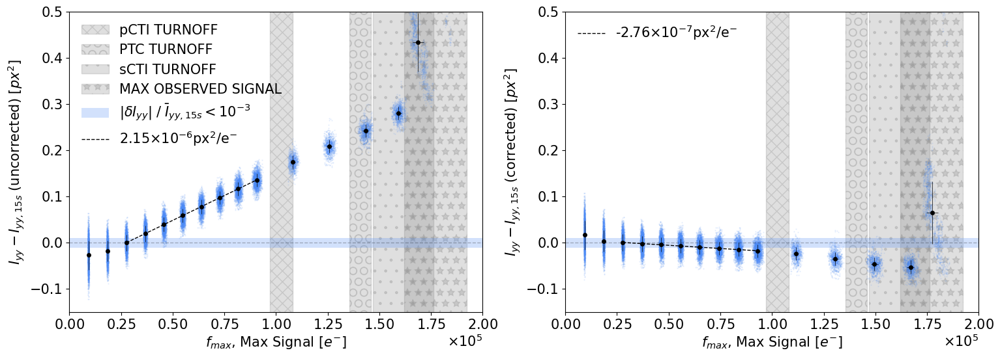

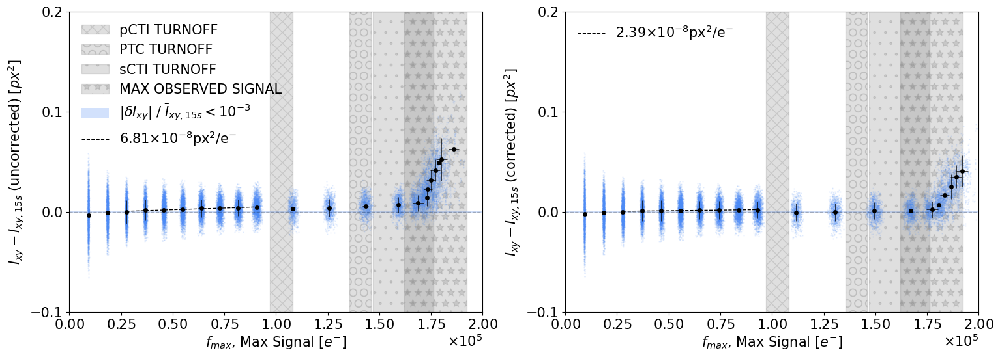

In [6]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-19T10:46:31_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T12:17:07_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-09-19T12:33:43_680nm_corrected.amatrix.nonFluxConserving.pkl", \
                             outdir + "data_13247_R03_S12_2023-09-19T10:47:54_680nm_corrected.amatrix.nonFluxConserving.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_amatrix_nonfluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_amatrix_nonfluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_amatrix_nonfluxconservingcorrection.png")



$a_{ij}$ (Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ -7.192e-07 $ & $ 2.642e-08 $
Ixx 140.0506234993525
$ 2.150e-06 $ & $ 5.336e-09 $
$ -4.577e-07 $ & $ 4.699e-09 $
Iyy 121.285667206543
$ 6.814e-08 $ & $ 7.587e-09 $
$ 2.103e-08 $ & $ 7.064e-09 $
Ixy 69.14339188553926


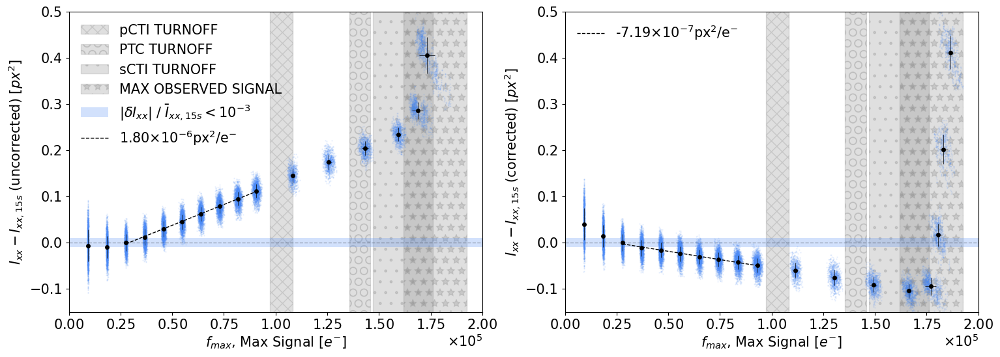

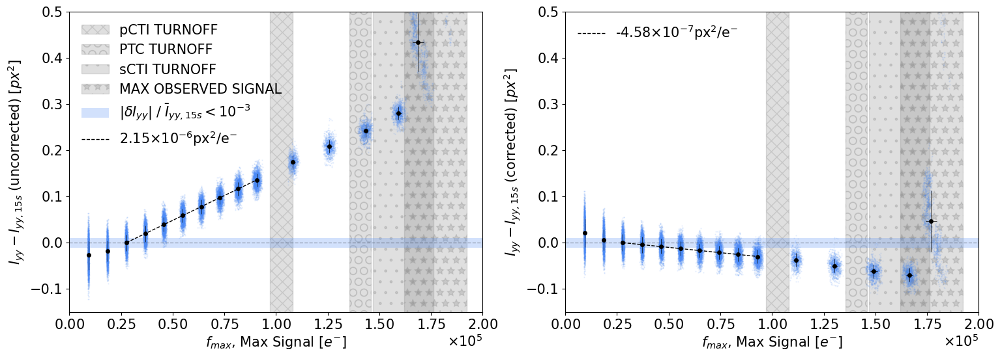

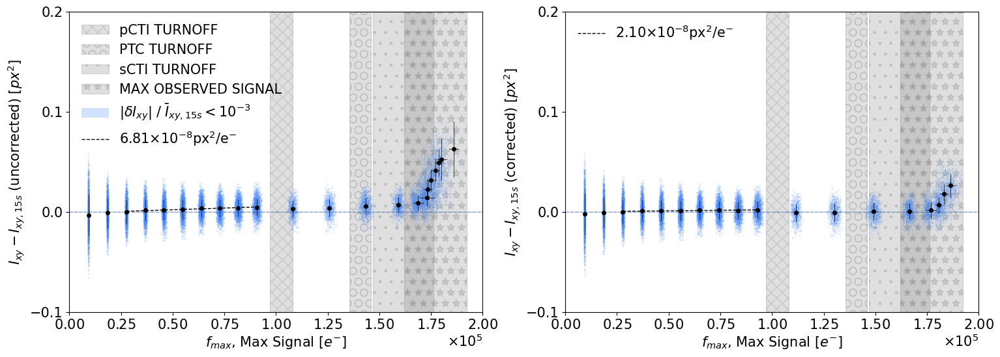

In [21]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-17T20:32:46_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-17T14:24:19_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-09-18T21:07:32_680nm_corrected.amatrix.fluxConserving.pkl", \
                             outdir + "data_13247_R03_S12_2023-09-18T00:29:07_680nm_corrected.amatrix.fluxConserving.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_amatrix_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_amatrix_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_amatrix_fluxconservingcorrection.png")



PCTI (Non-Flux Conserving Correction)

$ 1.796e-06 $ & $ 2.652e-08 $
$ 4.595e-07 $ & $ 2.395e-08 $
Ixx 74.41482537741018
$ 2.150e-06 $ & $ 5.336e-09 $
$ 6.722e-07 $ & $ 6.912e-09 $
Iyy 68.73796737520492
$ 6.814e-08 $ & $ 7.587e-09 $
$ 4.538e-08 $ & $ 7.434e-09 $
Ixy 33.406966446332845


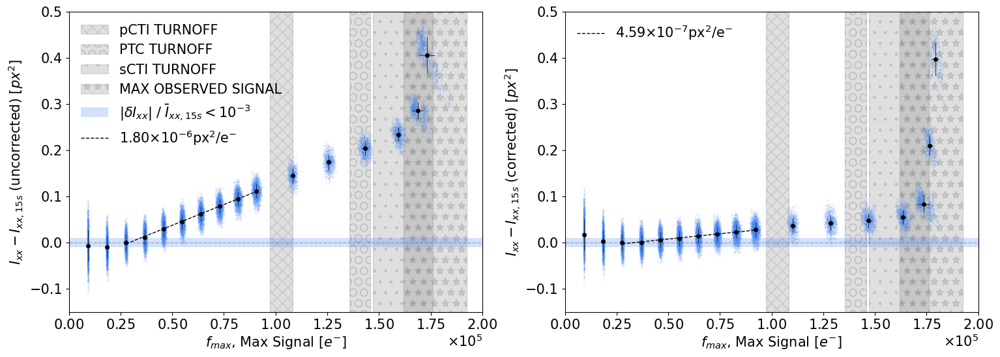

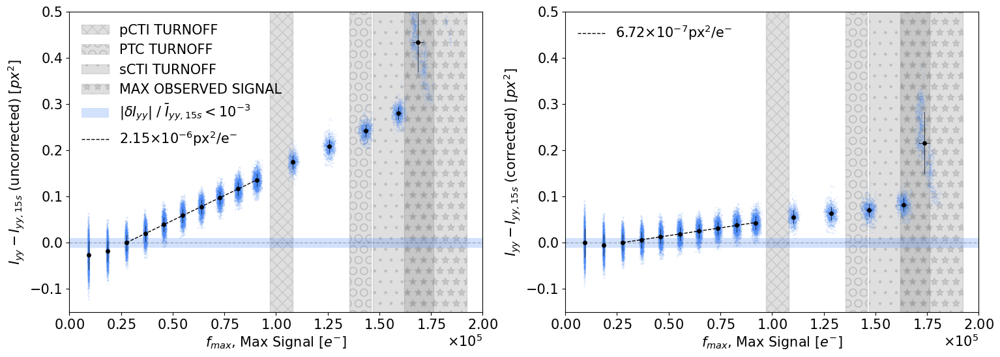

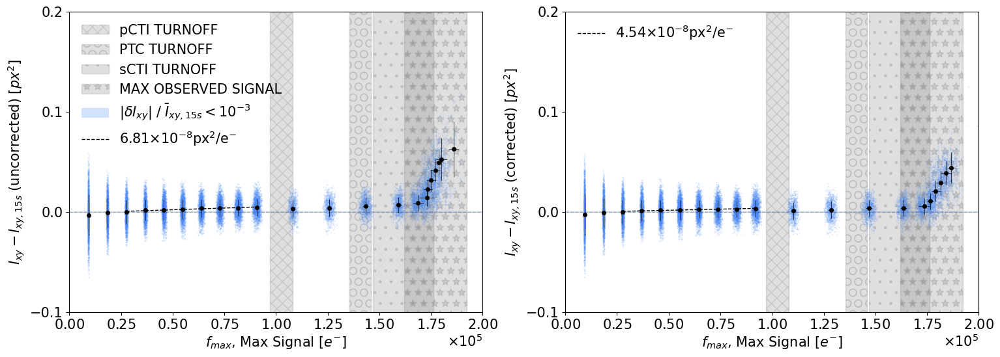

In [7]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-19T10:46:31_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T12:17:07_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-09-19T13:00:43_680nm_corrected.pcti.nonFluxConserving.pkl", \
                             outdir + "data_13247_R03_S12_2023-09-19T10:42:54_680nm_corrected.pcti.nonFluxConserving.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_pcti_nonfluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_pcti_nonfluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_pcti_nonfluxconservingcorrection.png")



PCTI (Flux Conserving Correction)

In [5]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13248_R03_S12_2023-08-16T09:55:40_680nm_uncorrected.pkl", \
                             outdir + "data_13247_R03_S12_2023-08-16T10:17:05_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-08-21T17:49:28_680nm_corrected.pcti.pkl", \
                             outdir + "data_13247_R03_S12_2023-08-21T16:09:56_680nm_corrected.pcti.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_pcti_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_pcti_fluxconservingcorrection.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_pcti_fluxconservingcorrection.png")



FileNotFoundError: [Errno 2] No such file or directory: '/sdf/home/a/abrought/run5/BF/data/2023-09-15/data_13248_R03_S12_2023-08-21T17:49:28_680nm_corrected.pcti.pkl'

# **Astier et al. (2023) Correction**

$ 1.796e-06 $ & $ 2.652e-08 $
$ 1.656e-07 $ & $ 2.596e-08 $
Ixx 90.7759721685939
$ 2.150e-06 $ & $ 5.336e-09 $
$ 3.143e-07 $ & $ 5.224e-09 $
Iyy 85.38276450337777
$ 6.814e-08 $ & $ 7.587e-09 $
$ 3.326e-08 $ & $ 7.212e-09 $
Ixy 51.185250640129595


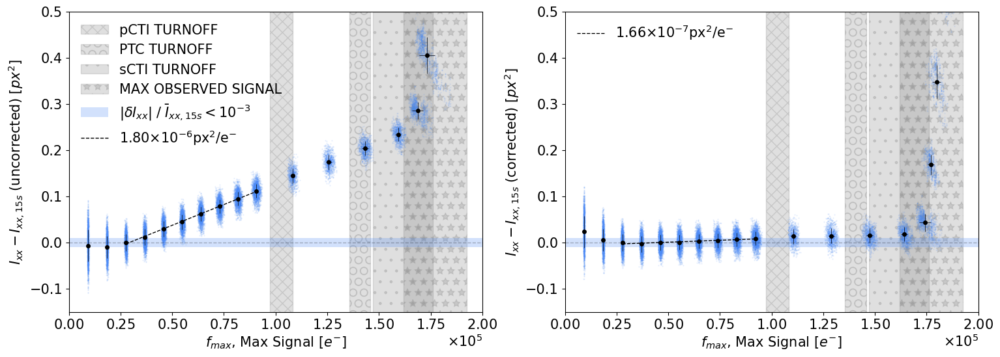

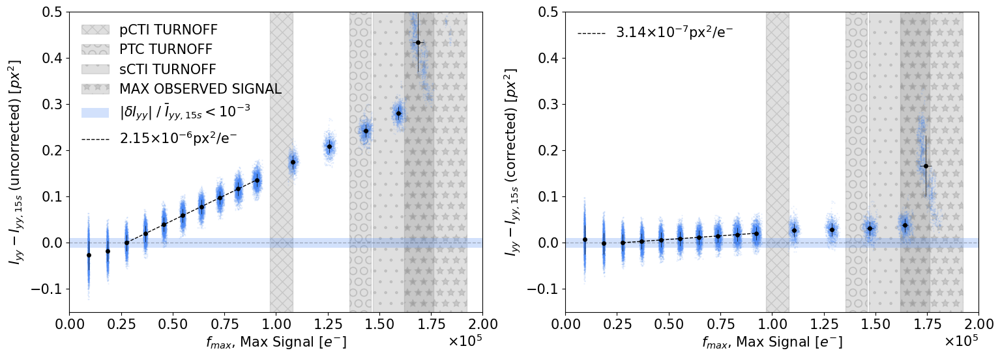

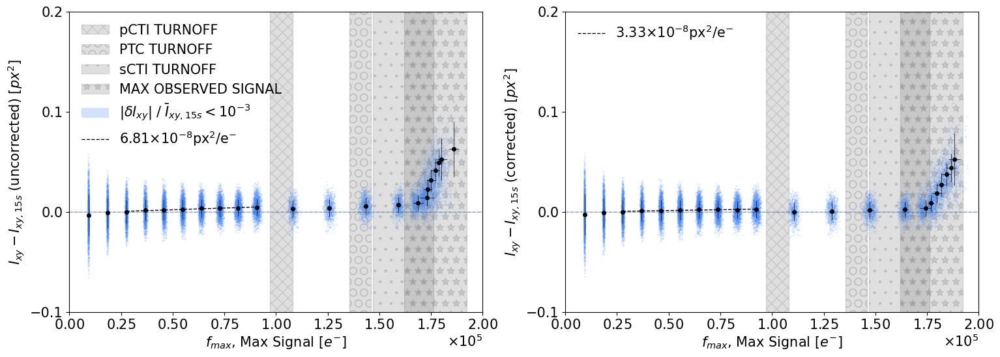

In [6]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-19T10:46:31_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T12:17:07_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-09-25T20:30:14_680nm_corrected.A23.v3.pkl", \
                             outdir + "data_13247_R03_S12_2023-09-25T18:55:00_680nm_corrected.A23.v3.pkl", \
                             expstoremove=1)


_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_a23.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_a23.png")

_ = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_a23.png")


# R24-S11

$ 3.318e-06 $ & $ 4.098e-08 $
$ 2.311e-07 $ & $ 3.877e-08 $
Ixx 93.03504551592803
$ 3.857e-06 $ & $ 6.033e-09 $
$ 5.770e-07 $ & $ 5.195e-09 $
Iyy 85.04142815197486
$ 7.979e-08 $ & $ 2.532e-09 $
$ 2.467e-08 $ & $ 2.432e-09 $
Ixy 69.08219542751351


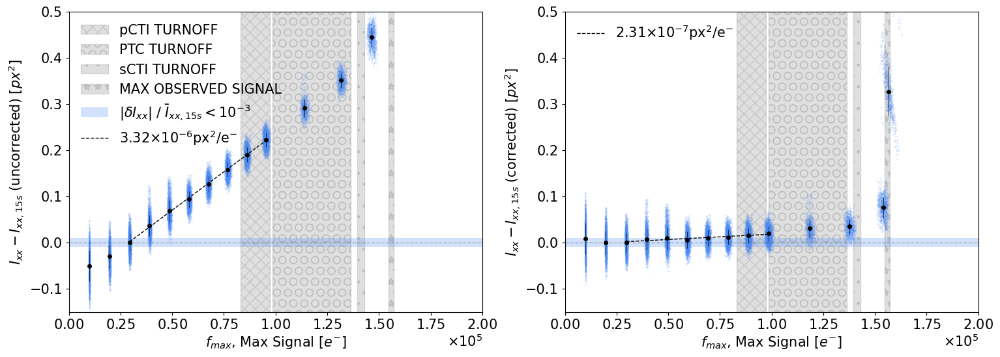

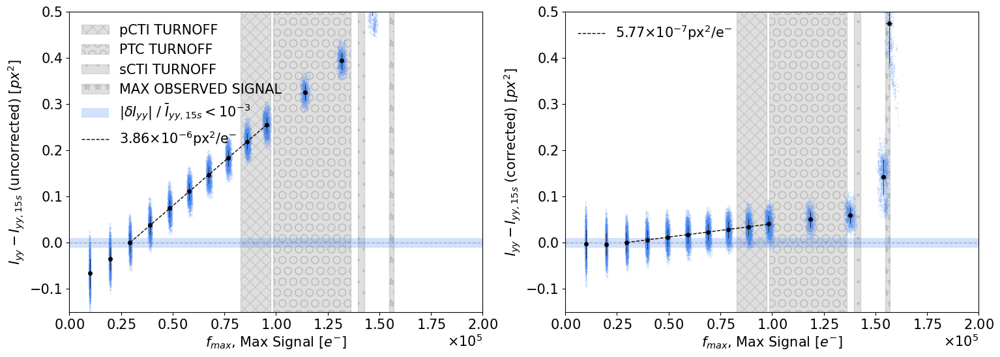

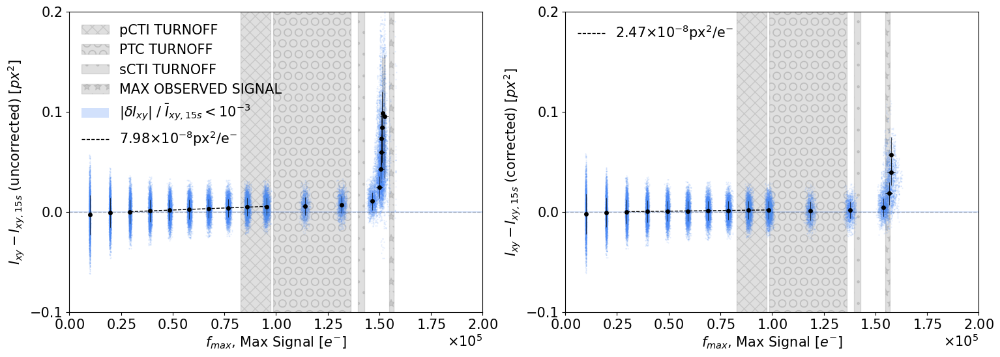

In [8]:
# Use sensor data
sensor = "R24_S11"
detector = 112

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-09-15/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13247_R03_S12_2023-09-19T10:46:31_680nm_uncorrected.pkl", \
                             outdir + "data_13248_R03_S12_2023-09-19T12:17:07_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13252_R24_S11_2023-09-18T00:03:56_680nm_corrected.fluxConserving.pkl", \
                             outdir + "data_13251_R24_S11_2023-09-17T18:20:48_680nm_corrected.fluxConserving.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_fluxconservingcorrection.png")

plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_fluxconservingcorrection.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_fluxconservingcorrection.png")



$ 3.318e-06 $ & $ 4.098e-08 $
$ 3.188e-08 $ & $ 3.755e-08 $
Ixx 99.03941567776982
$ 3.857e-06 $ & $ 6.033e-09 $
$ 3.950e-07 $ & $ 1.287e-08 $
Iyy 89.76009637425997
$ 7.979e-08 $ & $ 2.532e-09 $
$ 2.053e-08 $ & $ 2.418e-09 $
Ixy 74.2644485601531


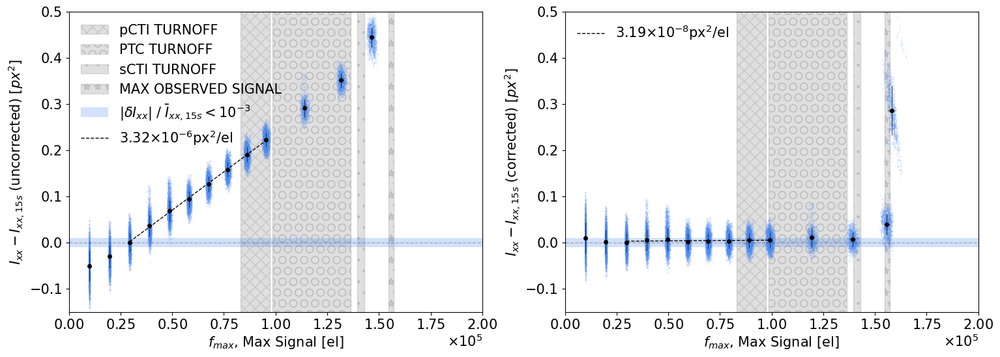

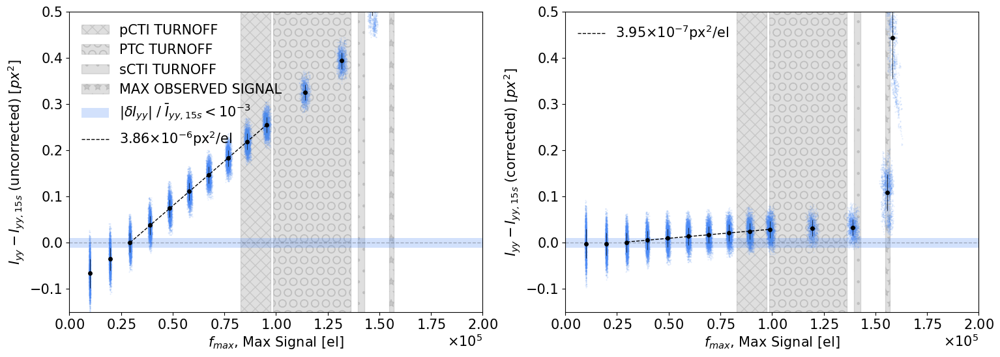

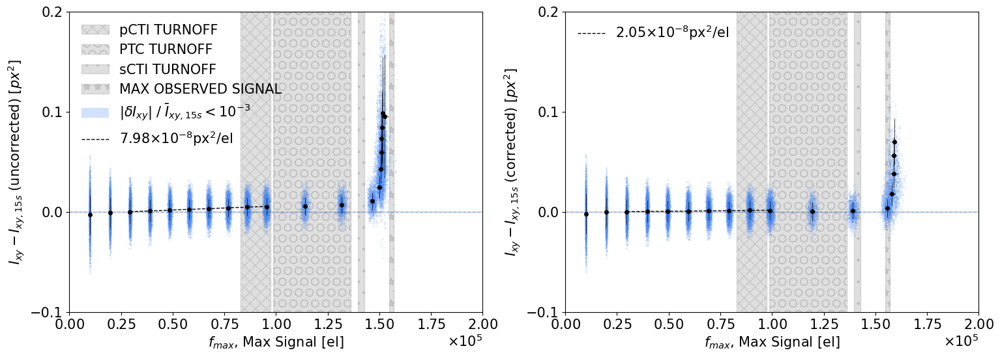

In [19]:
# Use sensor data
sensor = "R24_S11"
detector = 112

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-10-09/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13251_R24_S11_2023-10-27T12:32:27_680nm_uncorrected.pkl", \
                             outdir + "data_13252_R24_S11_2023-10-27T14:10:21_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13252_R24_S11_2023-10-28T15:00:18_680nm_corrected.pkl", \
                             outdir + "data_13251_R24_S11_2023-10-28T14:04:14_680nm_corrected.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_nonfluxconservingcorrection.png")

plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_nonfluxconservingcorrection.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_nonfluxconservingcorrection.png")



$ 3.318e-06 $ & $ 4.098e-08 $
$ -1.643e-08 $ & $ 3.755e-08 $
Ixx 100.49516117458883
$ 3.857e-06 $ & $ 6.033e-09 $
$ 4.350e-07 $ & $ 1.278e-08 $
Iyy 88.72086966730474
$ 7.979e-08 $ & $ 2.532e-09 $
$ 2.052e-08 $ & $ 2.418e-09 $
Ixy 74.27694751634377


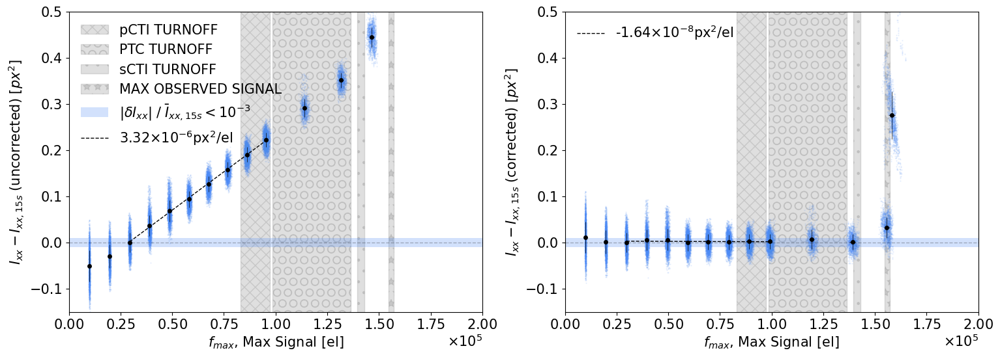

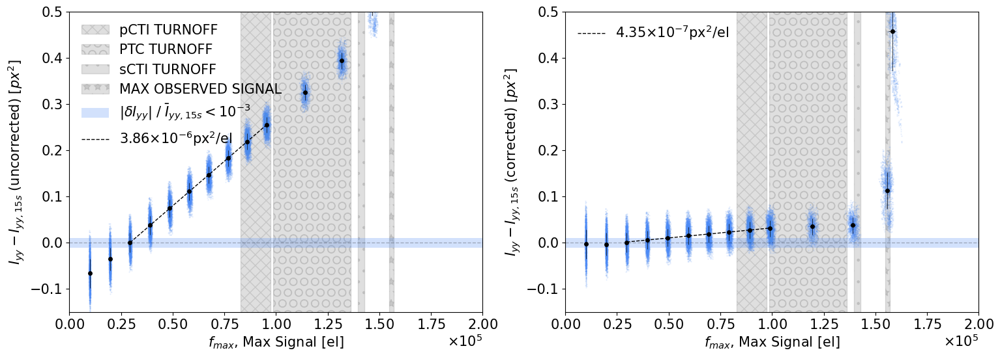

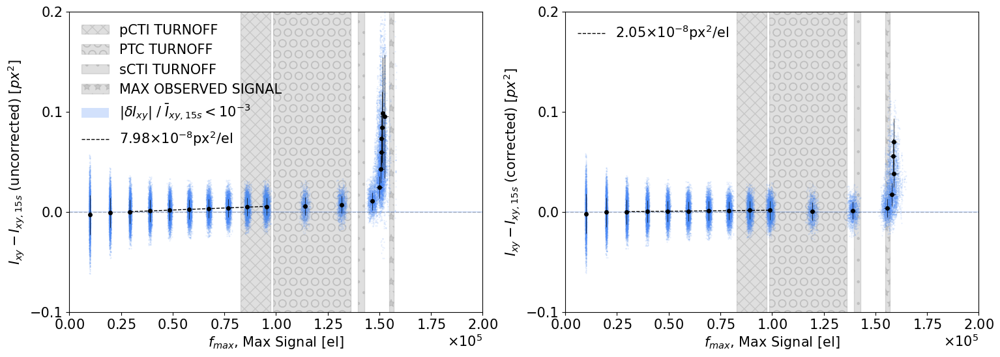

In [20]:
# Use sensor data
sensor = "R24_S11"
detector = 112

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-10-09/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13251_R24_S11_2023-10-27T12:32:27_680nm_uncorrected.pkl", \
                             outdir + "data_13252_R24_S11_2023-10-27T14:10:21_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13251_R24_S11_2023-10-28T06:03:06_680nm_corrected.transposedK.pkl", \
                             outdir + "data_13252_R24_S11_2023-10-28T06:53:59_680nm_corrected.transposedK.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_final_nonfluxconservingcorrection_transposedK.png")

plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_final_nonfluxconservingcorrection_transposedK.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$\mathrm{el}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_final_nonfluxconservingcorrection_transposedK.png")



# R02-S00

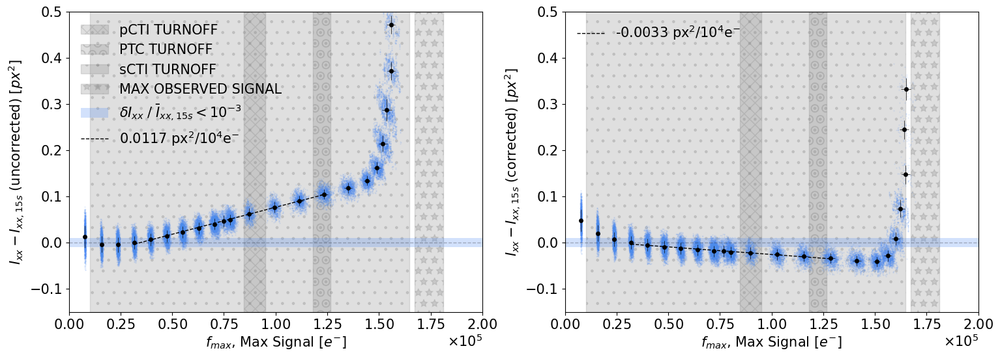

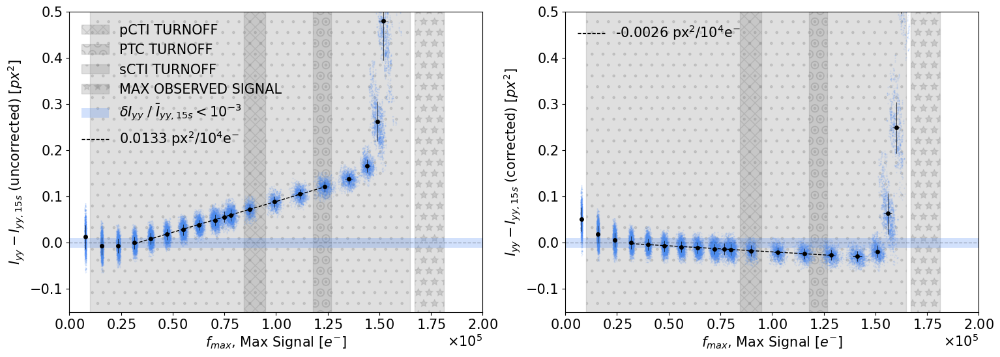

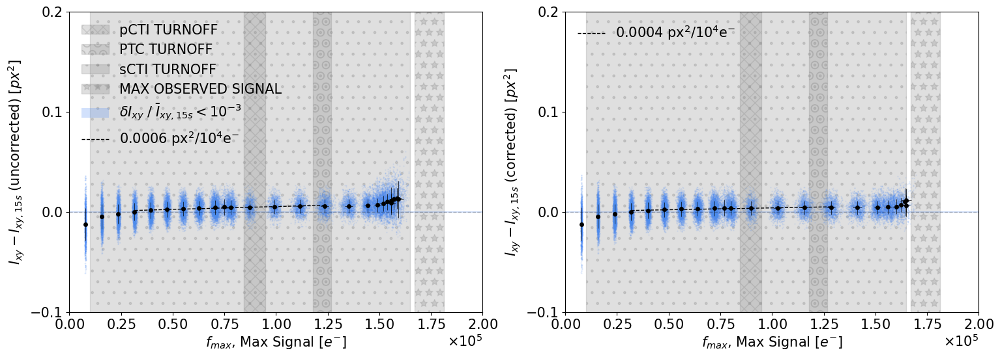

In [7]:
# Use sensor data
sensor = "R02_S00"
detector = 9

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13230_R02_S00_2023-08-03T14:18:42_680nm_uncorrected.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:00:43_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13230_R02_S00_2023-08-03T14:30:20_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:18:25_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixx", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample.png")

plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Iyy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_covsample.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_covsample.png")



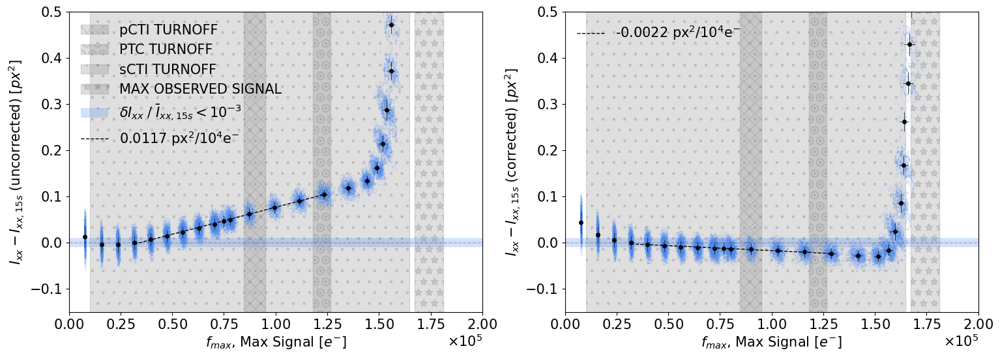

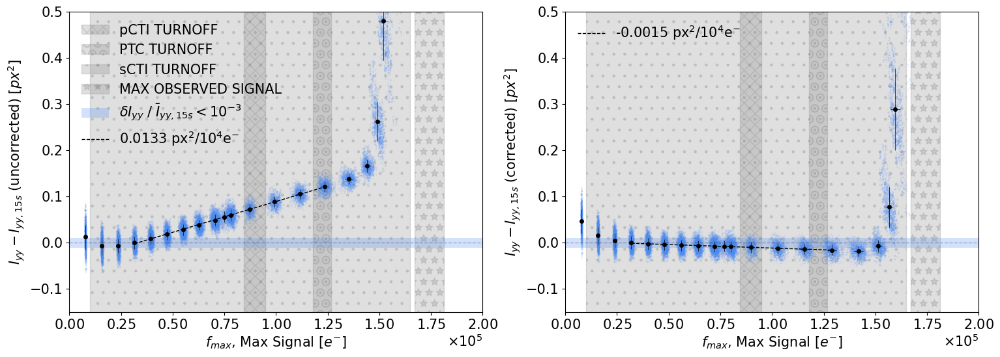

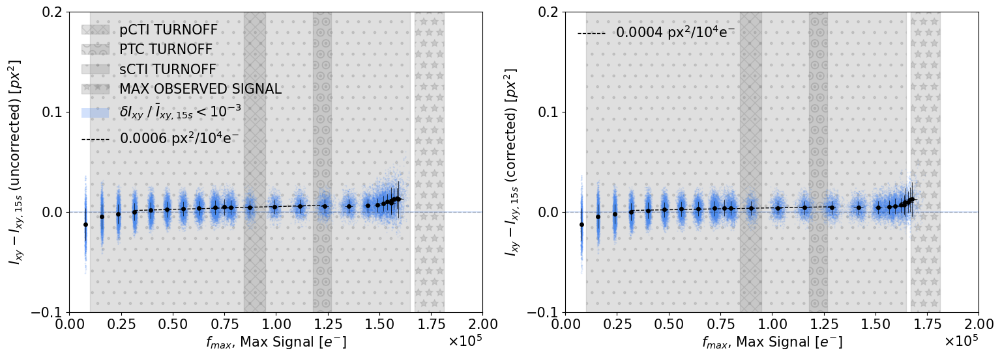

In [8]:
# Use sensor data
sensor = "R02_S00"
detector = 9

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13230_R02_S00_2023-08-03T14:18:42_680nm_uncorrected.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:00:43_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13230_R02_S00_2023-08-03T14:42:43_680nm_corrected.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:32:38_680nm_corrected.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixx", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample_nonfluxconservingcorrection.png")

plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Iyy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_covsample_nonfluxconservingcorrection.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_covsample_nonfluxconservingcorrection.png")



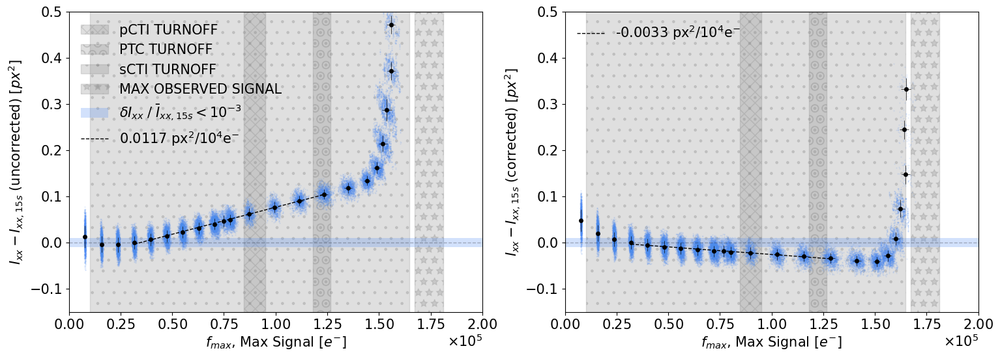

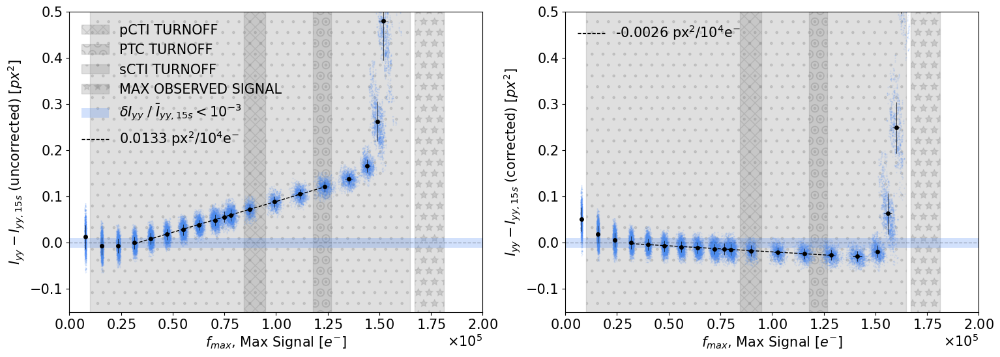

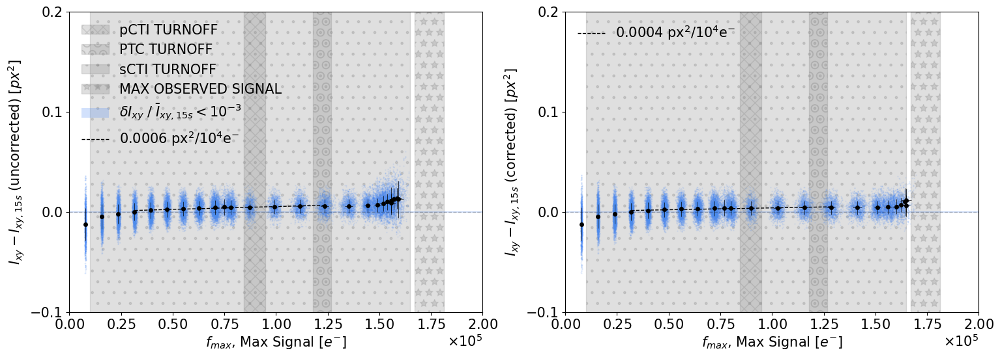

In [9]:
# Use sensor data
sensor = "R02_S00"
detector = 9

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13230_R02_S00_2023-08-03T14:18:42_680nm_uncorrected.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:00:43_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13230_R02_S00_2023-08-03T14:30:20_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:18:25_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixx", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample.png")

plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Iyy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_covsample.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_covsample.png")



IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

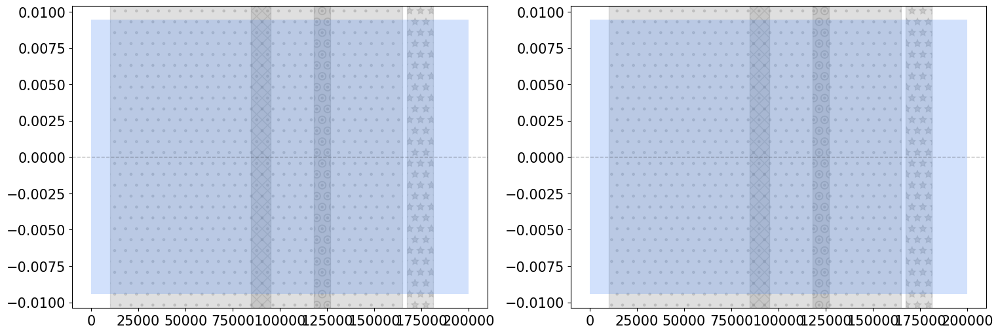

In [10]:
# Use sensor data
sensor = "R02_S00"
detector = 9

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13230_R02_S00_2023-08-03T14:18:42_680nm_uncorrected.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:00:43_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13230_R02_S00_2023-08-03T14:42:43_680nm_corrected.pkl", \
                             outdir + "data_13231_R02_S00_2023-08-03T15:32:38_680nm_corrected.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixx", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample_nonfluxconservingcorrection.png")

plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Iyy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_covsample_nonfluxconservingcorrection.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=15., xkey="peakSignal",ykey="Ixy", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_covsample_nonfluxconservingcorrection.png")



# R21-S02

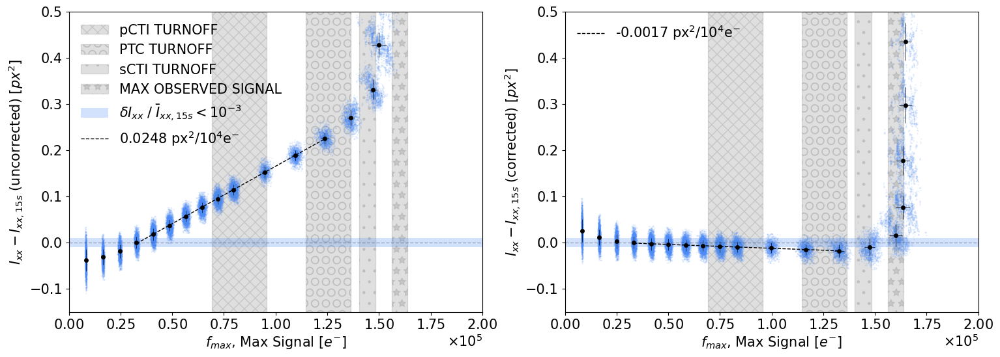

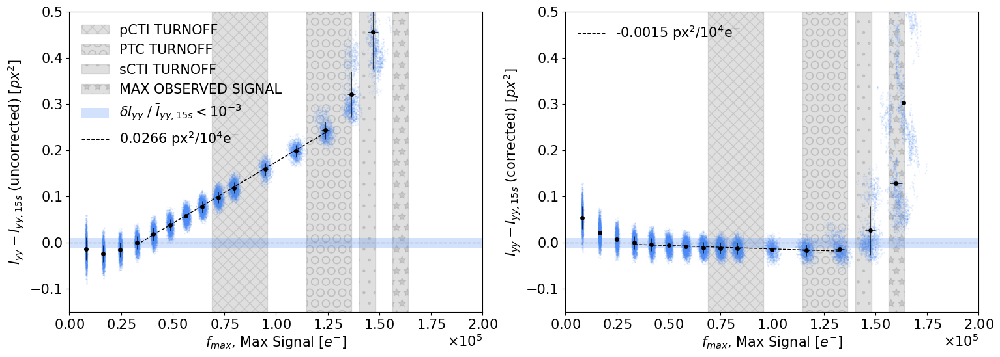

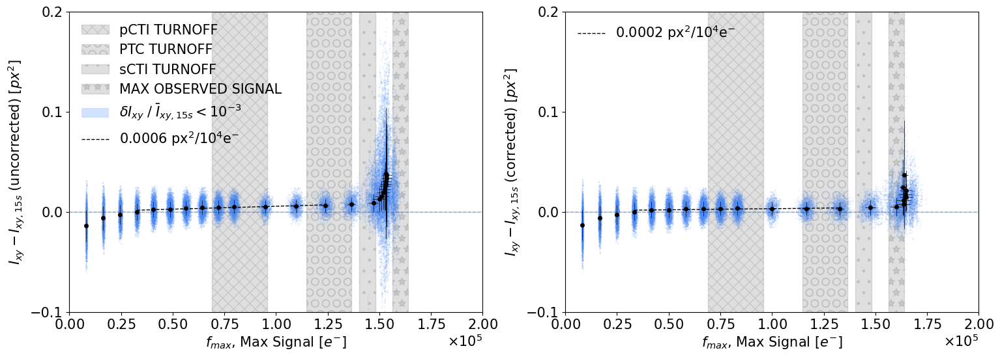

In [11]:
# Use sensor data
sensor = "R21_S02"
detector = 83

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13236_R21_S02_2023-08-03T14:19:15_680nm_uncorrected.pkl", \
                             outdir + "data_13238_R21_S02_2023-08-03T15:02:06_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13236_R21_S02_2023-08-03T14:30:37_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             outdir + "data_13238_R21_S02_2023-08-03T15:20:51_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixx", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample.png")

plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Iyy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_covsample.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_covsample.png")



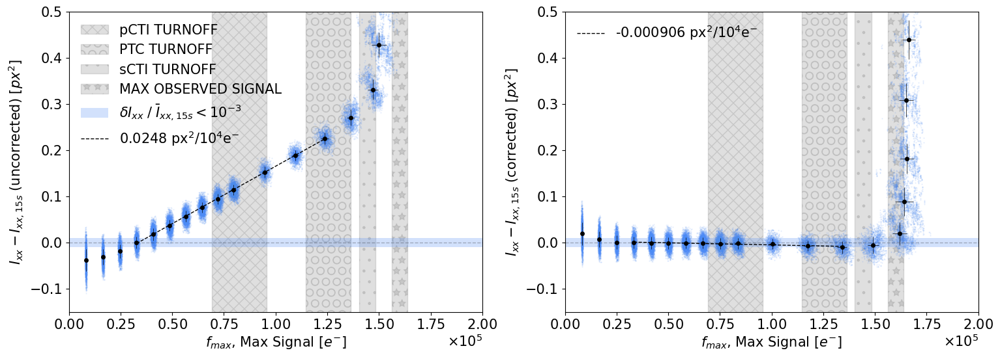

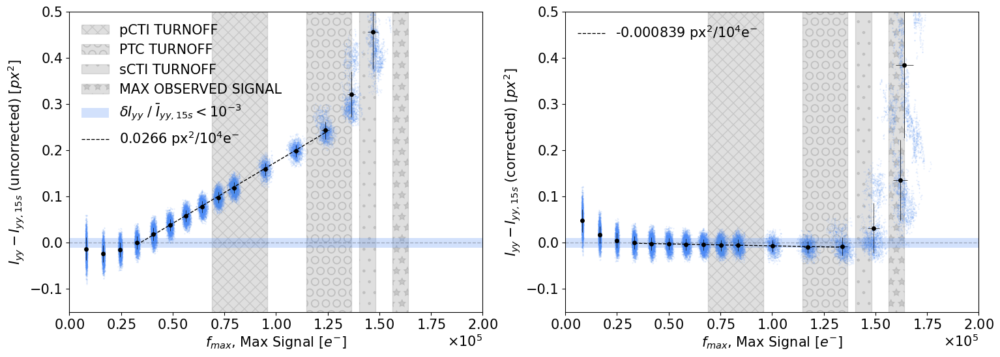

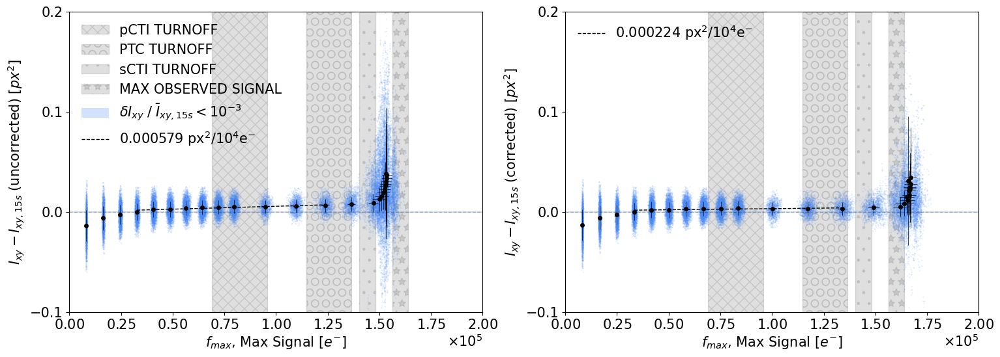

In [17]:
# Use sensor data
sensor = "R21_S02"
detector = 83

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13236_R21_S02_2023-08-03T14:19:15_680nm_uncorrected.pkl", \
                             outdir + "data_13238_R21_S02_2023-08-03T15:02:06_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13236_R21_S02_2023-08-03T14:42:51_680nm_corrected.pkl", \
                             outdir + "data_13238_R21_S02_2023-08-03T15:36:28_680nm_corrected.pkl", \
                             expstoremove=1)


plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixx", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample_nonfluxconservingcorrection.png")

plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Iyy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{yy} - I_{yy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{yy} - I_{yy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_iyy_covsample_nonfluxconservingcorrection.png")

xs,ys,es = plot_spots(data_uncorrected, data_corrected,t0=5., xkey="peakSignal",ykey="Ixy", 
           fitrange=(5,20), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xy} - I_{xy, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xy} - I_{xy, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.1,0.2),
           saveto=f"../plots/{sensor}_ixy_covsample_nonfluxconservingcorrection.png")



# Summary

In [6]:
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams.update({'font.size': 15})

(6, 3)


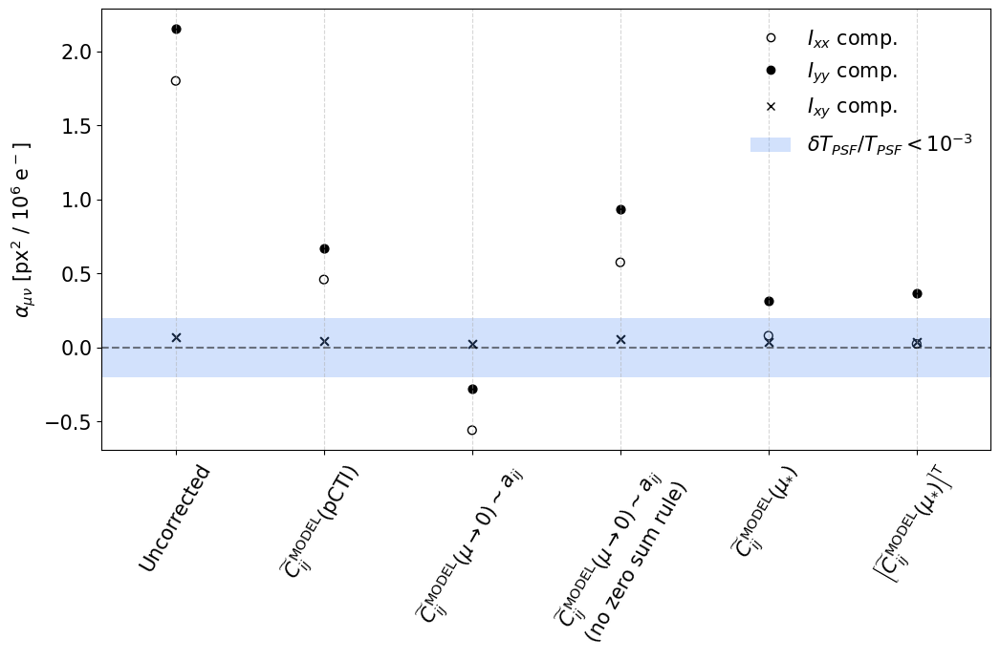

In [7]:
plt.figure(figsize=(12,6))
M = np.array([[1.8,2.15,0.0681], 
              [0.459,0.672,0.0454],
              [-0.558,-0.276,0.0239],
              [0.575,0.937,0.0598],
              [7.985e-08 * 1e6,3.173e-07 * 1e6,3.753e-08*1e6], 
              [2.491e-08 * 1e6,3.652e-07*1e6, 3.750e-08*1e6] ])

print(M.shape)

#plt.scatter([1,1,1],[.0178,.0211,0.0007], c=['#de5246','#4285F4','g'])
#plt.scatter([2,2,2],[-0.0028,-0.0003, 0.0003], c=['#de5246','#4285F4','g'])
#plt.scatter([3,3,3],[-0.0068,-0.0043,0.0003], c=['#de5246','#4285F4','g'])
#plt.scatter([4,4,4],[-0.0019,.0007,0.0004], c=['#de5246','#4285F4','g'])
#plt.scatter([5,5,5],[-0.002,.0008,0.0004], c=['#de5246','#4285F4','g'])
#plt.scatter([6,6,6],[0.0038,.0062,0.0005], c=['#de5246','#4285F4','g'])
plt.plot([],[],"o",markerfacecolor='none', markeredgecolor="k", label='$I_{xx}$ comp.')
plt.plot([],[],"o",markerfacecolor='k', markeredgecolor="k", label='$I_{yy}$ comp.')
plt.plot([],[],"x",color="k", label='$I_{xy}$ comp.')
plt.scatter(range(1,1 + M.shape[0]), M[:,0], s=40, marker="o", facecolors='none', edgecolor="k")
plt.scatter(range(1,1 + M.shape[0]), M[:,1], s=40, marker="o", facecolors='k', edgecolor="k")
plt.scatter(range(1,1 + M.shape[0]), M[:,2], s=40, marker="x", c="k")
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
plt.xticks(range(1,1 + M.shape[0]),
           [r"Uncorrected", 
            r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mathrm{pCTI})$",
            r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$", 
            r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$" + "\n (no zero sum rule)",
            "$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$",
            r"$\left [ \widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*}) \right ]^\mathrm{T}$"], rotation=60)
plt.ylabel(r"$\alpha_{\mu\nu}$ [px$^2$ / $10^6\;\mathrm{e}^-$]")
plt.fill_between(range(1-1,2 + M.shape[0]),y1 = [-0.2 for i in range(1-1,2 + M.shape[0])],y2 = [0.2 for i in range(1-1,2 + M.shape[0])], color='#4c8bf5', edgecolor="None",alpha=0.25, label='$\delta T_{PSF} / T_{PSF} < 10^{-3}$')
plt.grid(visible=True, which='major', axis='x',linestyle="--",alpha=0.5)
plt.legend(loc='upper right',frameon=False)
plt.axhline(0,linestyle="--", color="k", alpha=0.5)
plt.xlim(0.5,M.shape[0]+0.5)
plt.savefig(r"../plots/summary_spots.png", bbox_inches='tight')



## **Summary detailed**

(8, 3)


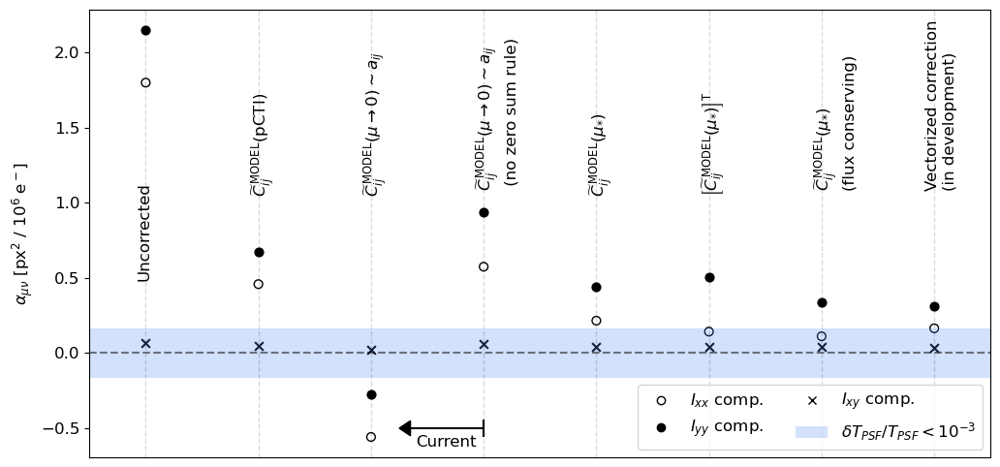

In [54]:
plt.figure(figsize=(12,6))
M = np.array([[1.8,2.15,0.0681], 
              [0.459,0.672,0.0454],
              [-0.558,-0.276,0.0239],
              [0.575,0.937,0.0598],
              [0.216,0.442,0.0403],
              [0.143,0.506,0.0402],
              [1.119e-1,3.386e-1,3.880e-2],
              [1.65e-1, 3.14e-1, 3.33e-2]])

plt.rcParams.update({'font.size': 12})

print(M.shape)
for i in range(1,1 + M.shape[0]):
    plt.axvline(i, linestyle="--", color="k", alpha=0.15, linewidth=1.0)

#plt.scatter([1,1,1],[.0178,.0211,0.0007], c=['#de5246','#4285F4','g'])
#plt.scatter([2,2,2],[-0.0028,-0.0003, 0.0003], c=['#de5246','#4285F4','g'])
#plt.scatter([3,3,3],[-0.0068,-0.0043,0.0003], c=['#de5246','#4285F4','g'])
#plt.scatter([4,4,4],[-0.0019,.0007,0.0004], c=['#de5246','#4285F4','g'])
#plt.scatter([5,5,5],[-0.002,.0008,0.0004], c=['#de5246','#4285F4','g'])
#plt.scatter([6,6,6],[0.0038,.0062,0.0005], c=['#de5246','#4285F4','g'])
plt.plot([],[],"o",markerfacecolor='none', markeredgecolor="k", label='$I_{xx}$ comp.')
plt.plot([],[],"o",markerfacecolor='k', markeredgecolor="k", label='$I_{yy}$ comp.')
plt.plot([],[],"x",color="k", label='$I_{xy}$ comp.')
plt.scatter(range(1,1 + M.shape[0]), M[:,0], s=40, marker="o", facecolors='none', edgecolor="k")
plt.scatter(range(1,1 + M.shape[0]), M[:,1], s=40, marker="o", facecolors='k', edgecolor="k")
plt.scatter(range(1,1 + M.shape[0]), M[:,2], s=40, marker="x", c="k")
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
# plt.xticks(range(1,1 + M.shape[0]),
#            [r"Uncorrected", 
#             r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mathrm{pCTI})$",
#             r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$", 
#             r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$" + "\n (no zero sum rule)",
#             "$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$",
#             r"$\left [ \widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*}) \right ]^\mathrm{T}$",
#             r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$" + "\n Flux Conserving Corr",
#             "Astier et al. (2023)"], rotation=60)


plt.text(1-.0775,.5, r"Uncorrected", rotation=90)
plt.text(2-.0775,1.1, r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mathrm{pCTI})$", rotation=90)
plt.text(3-.0775,1.1, r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$", rotation=90)
plt.text(4-.0775,1.1, r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$" + "\n (no zero sum rule)", rotation=90)
plt.text(5-.0775,1.1, "$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$", rotation=90)
plt.text(6-.0775,1.1, r"$\left [ \widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*}) \right ]^\mathrm{T}$", rotation=90)
plt.text(7-.0775,1.1, r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$" + "\n(flux conserving)", rotation=90)
plt.text(8-.0775,1.1, "Vectorized correction \n(in development)", rotation=90)


plt.ylabel(r"$\alpha_{\mu\nu}$ [px$^2$ / $10^6\;\mathrm{e}^-$]")

plt.gca().get_xticklabels()[6].set_color('green') 
plt.gca().get_xticklabels()[7].set_color('green')
plt.fill_between(range(1-1,2 + M.shape[0]),y1 = [-0.00167*100 for i in range(1-1,2 + M.shape[0])],y2 = [0.00167*100 for i in range(1-1,2 + M.shape[0])], color='#4c8bf5', edgecolor="None",alpha=0.25, label='$\delta T_{PSF} / T_{PSF} < 10^{-3}$')
plt.grid(visible=True, which='major', axis='x',linestyle="--",alpha=0.5)
plt.legend(loc='lower right',ncol=2,frameon=True)
plt.axhline(0,linestyle="--", color="k", alpha=0.5)
plt.xlim(0.5,M.shape[0]+0.5)
plt.gca().get_xaxis().set_visible(False)
plt.arrow(4, -.5, -.75, 0, length_includes_head=True,head_width=0.1, head_length=0.1, color="k")
plt.plot([4,4],[-.5-.05,-.5+.05], "-", color="k")
plt.text(3.4,-.5-.125, "Current")
plt.savefig(r"../plots/summary_spots.png", bbox_inches='tight')



(6, 3)


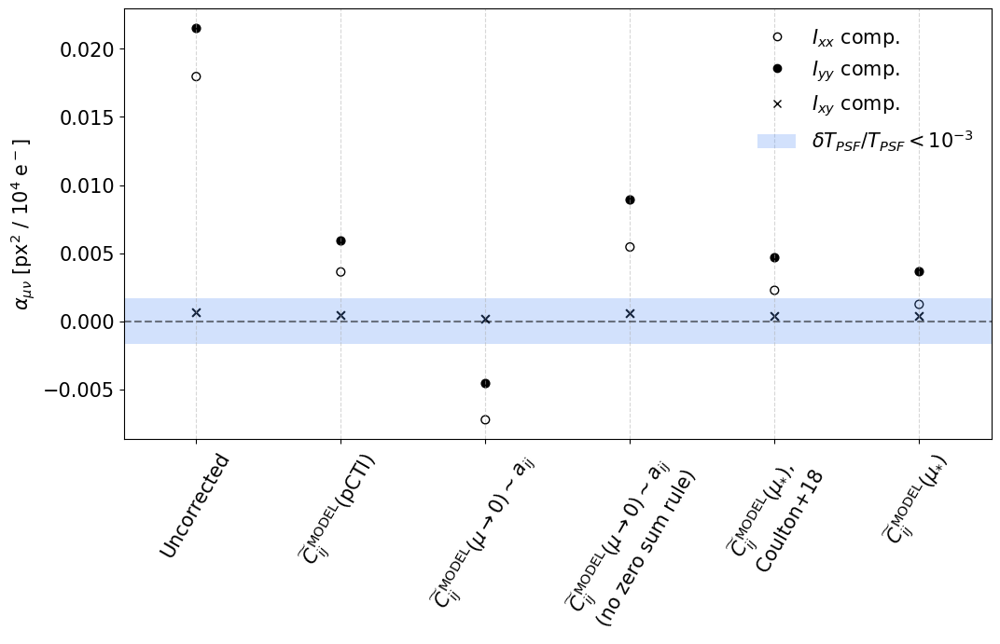

In [31]:
plt.figure(figsize=(12,6))
M = np.array([[.01796,.0215,0.000681], 
              [0.00362,0.00594,0.000441],
              [-0.00723,-0.00456,0.000211],
              [0.00545,.00895,0.000605],
              [0.00227,0.00468,0.000408],
              [0.00124,0.00365,0.000393] ])
              #[0.00177,0.00595,0.000898] ])
M *= 100
print(M.shape)

#plt.scatter([1,1,1],[.0178,.0211,0.0007], c=['#de5246','#4285F4','g'])
#plt.scatter([2,2,2],[-0.0028,-0.0003, 0.0003], c=['#de5246','#4285F4','g'])
#plt.scatter([3,3,3],[-0.0068,-0.0043,0.0003], c=['#de5246','#4285F4','g'])
#plt.scatter([4,4,4],[-0.0019,.0007,0.0004], c=['#de5246','#4285F4','g'])
#plt.scatter([5,5,5],[-0.002,.0008,0.0004], c=['#de5246','#4285F4','g'])
#plt.scatter([6,6,6],[0.0038,.0062,0.0005], c=['#de5246','#4285F4','g'])
plt.plot([],[],"o",markerfacecolor='none', markeredgecolor="k", label='$I_{xx}$ comp.')
plt.plot([],[],"o",markerfacecolor='k', markeredgecolor="k", label='$I_{yy}$ comp.')
plt.plot([],[],"x",color="k", label='$I_{xy}$ comp.')
plt.scatter(range(1,1 + M.shape[0]), M[:,0], s=40, marker="o", facecolors='none', edgecolor="k")
plt.scatter(range(1,1 + M.shape[0]), M[:,1], s=40, marker="o", facecolors='k', edgecolor="k")
plt.scatter(range(1,1 + M.shape[0]), M[:,2], s=40, marker="x", c="k")
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
#plt.scatter([1,1],[], c=['r','b'])
plt.xticks(range(1,1 + M.shape[0]),
           [r"Uncorrected", 
            r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mathrm{pCTI})$",
            r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$", 
            r"$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu \rightarrow 0) \sim a_{ij}$" + "\n (no zero sum rule)",
            "$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$, \n Coulton+18",
            "$\widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*})$"], #r"$\left [ \widetilde{C}_{ij}^{\,\mathrm{MODEL}}(\mu_{*}) \right ]^\mathrm{T}$"]
            rotation=60)
plt.ylabel(r"$\alpha_{\mu\nu}$ [px$^2$ / $10^4\;\mathrm{e}^-$]")
plt.fill_between(range(1-1,2 + M.shape[0]),y1 = [-0.00167 for i in range(1-1,2 + M.shape[0])],y2 = [0.00167 for i in range(1-1,2 + M.shape[0])], color='#4c8bf5', edgecolor="None",alpha=0.25, label='$\delta T_{PSF} / T_{PSF} < 10^{-3}$')
plt.grid(visible=True, which='major', axis='x',linestyle="--",alpha=0.5)
plt.legend(loc='upper right',frameon=False)
plt.axhline(0,linestyle="--", color="k", alpha=0.5)
plt.xlim(0.5,M.shape[0]+0.5)
plt.savefig(r"../plots/summary_spots.png", bbox_inches='tight')



# Charge Conservation

In [5]:
# Imports
import sys
sys.path.append('/sdf/home/a/abrought/bin')
from SpotAnalysis import *
import matplotlib.pyplot as plt
from IPython.display import display, Latex
from matplotlib.pyplot import cm
import matplotlib

def getUniqueIndices(records_array):

    vals, indxs = np.unique(records_array, return_index=True)

    return indxs

def plot_spot_cons(data, t0, xkey, ykey, fitrange, figsize, fontsize, xlabel, ylabel, ylabel2, xlim, ylim, sensor, detector, saveto):
    
    fig, ax1 = plt.subplots(1,1, figsize=figsize, facecolor="white")
    ax1.axhline(0.0, linestyle="--", color="k", alpha=0.25)

    def reject_outliers(d, m=5):
        return (np.abs(d - np.mean(d)) <= m * np.std(d))
    
    # Get the reference spots
    ref_data = data[data['exptime'] == t0]
    ref_spots = []
    for exp in ref_data:
        ref_spots.extend(['%04d' % n for n in exp['spot_indices']])
    ref_spots = np.unique(ref_spots)
    
    ref_spots_dict = dict()
    ref_spots_dict_err = dict()
    for spot in ref_spots:
        ref_spots_dict[spot] = []
        for exp in ref_data:
            if spot in ['%04d' % n for n in exp['spot_indices']]:
                this_spot = np.asarray(['%04d' % n for n in exp['spot_indices']]) == spot
                temp = exp['base_CircularApertureFlux_3_0_instFlux'][this_spot]/exp['base_CircularApertureFlux_25_0_instFlux'][this_spot]
                ref_spots_dict[spot].append(temp[0])

    for spot in ref_spots_dict.keys():
        mean = np.mean(ref_spots_dict[spot])
        std  = np.std(ref_spots_dict[spot])
        ref_spots_dict_err[spot] = std / np.sqrt(len(ref_spots_dict[spot]))
        ref_spots_dict[spot] = mean
    
    # Get data for all spots
    ys = []
    xs = []
    es = []
    for exp in data:
        spots_in_this_exp = np.asarray(['%04d' % n for n in exp['spot_indices']])
        these_spots = np.intersect1d(ref_spots, spots_in_this_exp)

        

        for spot in these_spots:
            this_spot = (spots_in_this_exp == spot)
            if exp['channels'][this_spot] == 'C07':
                continue
            
            xs.append(exp[xkey][this_spot] * exp['corresponding_gains'][this_spot])
            ys.append((exp['base_CircularApertureFlux_3_0_instFlux'][this_spot]/exp['base_CircularApertureFlux_25_0_instFlux'][this_spot] - ref_spots_dict[spot]) / ref_spots_dict[spot])
            es.append(exp['exptime'])
    
    xs = np.asarray(xs)
    ys = np.asarray(ys)
    es = np.asarray(es)

  
            
    # Plot
    
    matplotlib.rcParams.update({'font.size': 15})
    
    exptimes = np.unique(data['exptime'])
    normalize = matplotlib.colors.Normalize(vmin=np.min(exptimes), vmax=np.max(exptimes))
    
    fitx = []
    fity = []
    
    for i, e in enumerate(exptimes):
        select = (es==e)
        m = 3
        good = reject_outliers(xs[select], m=3)[:,0] * reject_outliers(ys[select], m=3)[:,0]

        n = len(es[select][good])
        
        xerr = np.std(xs[select][good]) #/np.sqrt(n)
        yerr = np.std(ys[select][good]) #/np.sqrt(n)
        
        if e >= fitrange[0] and e <= fitrange[1]:
            fitx.append(np.mean(xs[select][good]))
            fity.append(np.mean(ys[select][good]))

        #c=es[select][good]
        im1 = ax1.scatter(xs[select][good], ys[select][good], c="#4c8bf5", cmap='turbo', norm=normalize, s=.5, alpha=0.1)
        ax1.errorbar(np.mean(xs[select][good]), np.mean(ys[select][good]), 
                     xerr=xerr, yerr=yerr,
                     fmt="o", mfc="k",color="k",mec="k",ecolor="k",alpha=1,
                     ms=4.5,mew=0., capsize=0, capthick=0., elinewidth=1.)
    
    m, b  = np.polyfit(fitx, fity, 1)
    slope = m*10000
    print(m)
    #ax1.text(slopeLoc[0],slopeLoc[1], )
    #ax1.plot(np.linspace(np.min(fitx),np.max(fitx), 1000), m*np.linspace(np.min(fitx),np.max(fitx), 1000) + b, color="black" , linestyle="--", label="{}".format(str(round(slope,4))) +" px$^2$ / 10k $e^{-}$")
    
    ax1.ticklabel_format(axis="x", style="sci", scilimits=(0,0), useMathText=True)
    ax1.set_xlim(xlim)
    ax1.set_ylim(ylim)
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel)
    ax1.set_xlim(xlim[0],xlim[1])
    ax1.set_ylim(ylim[0],ylim[1])
    
    plt.savefig(saveto, bbox_inches="tight")
    return xs,ys,es
    
    

KeyError: 'base_CircularApertureFlux_3_0_instFlux'

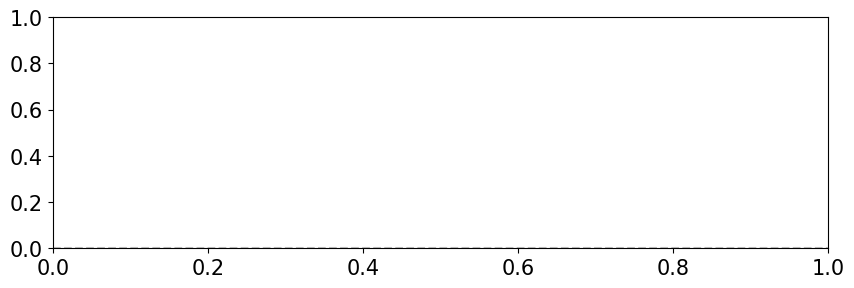

In [6]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13248_R03_S12_2023-08-16T09:55:40_680nm_uncorrected.pkl", \
                             outdir + "data_13247_R03_S12_2023-08-16T10:17:05_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-08-17T10:10:35_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             outdir + "data_13247_R03_S12_2023-08-18T10:26:17_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             expstoremove=1)


plot_spot_cons(data_corrected,t0=15., xkey="base_CircularApertureFlux_25_0_instFlux",ykey="Ixx", 
           fitrange=(15,50), figsize=(10,3),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$\hat{F}$, Mean Integrated Signal, $r < 25\mathrm{px}$ [$e^{-}$]",
           ylabel="{}".format("$(f-f_{15s})/f_{15s}$"),
           ylabel2="{}".format("$(f-f_{15s})/f_{15s}$"),
           xlim=(0,7.5e6),
           ylim=(-.2,0.2),
           saveto=f"../plots/chargeconservation.png")

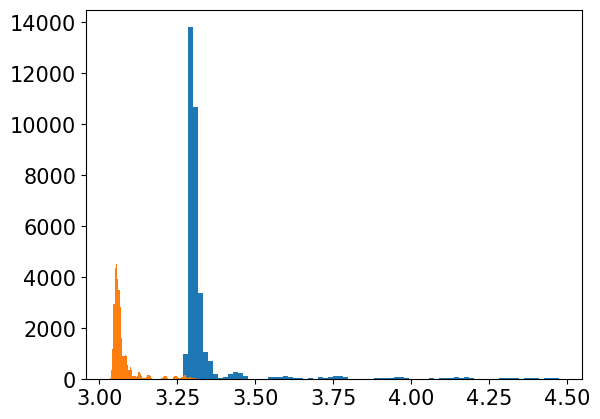

In [8]:
ixx = []
iyy = []
ixy = []
for exp in data_corrected:
    if exp['exptime'] == 15.:
        ixx.extend(exp['Ixx'])
        iyy.extend(exp['Iyy'])
        ixy.extend(exp['Ixy'])
        
ixx = np.asarray(ixx)
iyy = np.asarray(iyy)
ixy = np.asarray(ixy)

_ = plt.hist(np.concatenate(data_uncorrected['a'].data).ravel(), bins=75)
_ = plt.hist(np.concatenate(data_uncorrected['b'].data).ravel(), bins=75)

-24.066596811219362


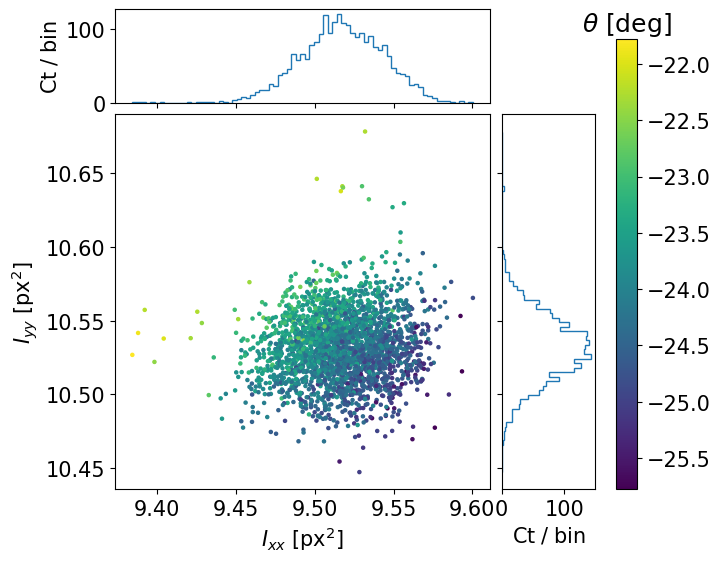

In [9]:
# some random data
x = ixx
y = iyy
z = ixy

def scatter_hist(x, y, z, ax, ax_histx, ax_histy):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    im = ax.scatter(x, y, c=(90./np.pi) * np.arctan((2*z) / (x-y)), s=5)
    print(np.mean((90./np.pi) * np.arctan((2*z) / (x-y))))
    #ax.set_ylim(10.3,10.65)
    #ax.set_xlim(9.25,9.6)

    # now determine nice limits by hand:
    ax_histx.hist(x, bins=75, histtype='step')
    ax_histy.hist(y, bins=75, histtype='step', orientation='horizontal')
    ax_histx.set_ylabel("Ct$\;$/$\;$bin")
    ax_histy.set_xlabel("Ct$\;$/$\;$bin")
    
    ax.set_ylabel("$I_{yy}$ [px$^2$]")
    ax.set_xlabel("$I_{xx}$ [px$^2$]")
    
    cbar_ax = fig.add_axes([0.935, 0.1, 0.035, 0.75])
    cbar = plt.colorbar(im, cax=cbar_ax)
    cbar.ax.set_title(r'$\theta$ [deg]')
    
# Start with a square Figure.
fig = plt.figure(figsize=(6, 6))
# Add a gridspec with two rows and two columns and a ratio of 1 to 4 between
# the size of the marginal axes and the main axes in both directions.
# Also adjust the subplot parameters for a square plot.
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)
# Create the Axes.
ax = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
# Draw the scatter plot and marginals.
scatter_hist(x, y, z, ax, ax_histx, ax_histy)

plt.savefig("../plots/spotshapes.png", bbox_inches='tight')


[9.39, 9.45, 9.52, 9.58, 9.64]
[9.39, 9.45, 9.52, 9.58, 9.64]
[9.39, 9.45, 9.52, 9.58, 9.64]
0.0033333333333338544
[10.41, 10.47, 10.53, 10.59, 10.66]
[10.41, 10.47, 10.53, 10.59, 10.66]
[10.41, 10.47, 10.53, 10.59, 10.66]
[0.44, 0.5, 0.57, 0.63, 0.69]
[0.44, 0.5, 0.57, 0.63, 0.69]
[0.44, 0.5, 0.57, 0.63, 0.69]


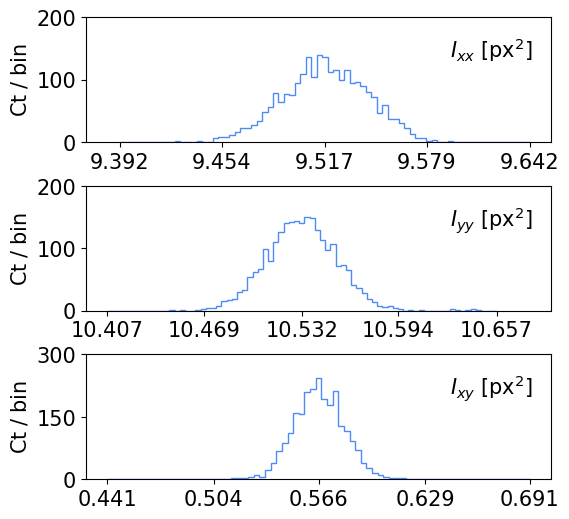

In [29]:
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(6,6))
def norm_range(d, drange=0.2):
    return (np.mean(d) - drange/2., np.mean(d) + drange/2.)
def get_centered_xticks_on_mean(d, drange=0.25, nticks=5):
    assert nticks % 2 == 1
    r = norm_range(d, drange=drange)
    print([round(t,2) for t in np.linspace(r[0], r[1], nticks)])
    return [round(t,3) for t in np.linspace(r[0], r[1], nticks)]

    
fig.subplots_adjust(hspace=.35)
x_range = (get_centered_xticks_on_mean(ixx)[0], get_centered_xticks_on_mean(ixx)[-1])
ax1.set_xticks(get_centered_xticks_on_mean(ixx))
_ =ax1.hist(ixx, bins=75, histtype='step', linestyle="-", color="white", label="$I_{xx}$ [px$^2$]")
_ =ax1.hist(ixx, bins=75, range=x_range,color='#4c8bf5', histtype='step')
print(_[1][1] - _[1][0])
ax1.set_ylabel("Ct$\;$/$\;$bin")
ax2.set_xticks(get_centered_xticks_on_mean(iyy))
x_range = (get_centered_xticks_on_mean(iyy)[0], get_centered_xticks_on_mean(iyy)[-1])
_ =ax2.hist(iyy, bins=75, histtype='step', linestyle="-", color="white", label="$I_{yy}$ [px$^2$]")
_ =ax2.hist(iyy, bins=75, range=x_range, color='#4c8bf5', histtype='step')
ax2.set_ylabel("Ct$\;$/$\;$bin")
ax3.set_xticks(get_centered_xticks_on_mean(ixy))
x_range = (get_centered_xticks_on_mean(ixy)[0], get_centered_xticks_on_mean(ixy)[-1])
_ =ax3.hist(ixy, bins=75, histtype='step', linestyle="-", color="white", label="$I_{xy}$ [px$^2$]")
_ =ax3.hist(ixy, bins=75, range=x_range, color='#4c8bf5', histtype='step')
ax3.set_ylabel("Ct$\;$/$\;$bin")
ax1.legend(loc=1, frameon=False)
ax2.legend(loc=1, frameon=False)
ax3.legend(loc=1, frameon=False)
ax1.set_ylim(0,200)
ax2.set_ylim(0,200)
ax3.set_ylim(0,300)
ax3.set_yticks([0,150,300])
plt.savefig("../plots/spotshapes.png", bbox_inches='tight')

# Charge Conservation

In [46]:
def plot_charge_cons(data,data2, t0, xkey, ykey, fitrange, figsize, fontsize, xlabel, ylabel, ylabel2, xlim, ylim, sensor, detector, saveto):
    
    fig, ax1 = plt.subplots(1,1, figsize=figsize, facecolor="white")
        
    ax1.axhline(0.0, linestyle="--", color="k", linewidth=1, alpha=0.25)

    def reject_outliers(d, m=5):
        #print("d shape", d.shape)
        return (np.abs(d - np.mean(d)) <= m * np.std(d))
    
    xs_uncorrected = []
    xs_corrected = []
    ys_uncorrected = []
    ys_corrected = []
    es = []
    for i, (exp, corr_exp) in enumerate(zip(data, data2)):
        spots_in_exp_1 = np.asarray(['%04d' % n for n in exp['spot_indices']])
        spots_in_exp_2 = np.asarray(['%04d' % n for n in corr_exp['spot_indices']])
        these_spots = np.intersect1d(spots_in_exp_1, spots_in_exp_2)
        
        for spot in these_spots:
            this_spot_in_exp1 = (spots_in_exp_1 == spot)
            this_spot_in_exp2 = (spots_in_exp_2 == spot)
            
            xs_uncorrected.append(exp[xkey][this_spot_in_exp1])
            xs_corrected.append(corr_exp[xkey][this_spot_in_exp2])
            ys_uncorrected.append(exp[ykey][this_spot_in_exp1])
            ys_corrected.append(corr_exp[ykey][this_spot_in_exp2])
            es.append(exp['exptime'])
    
    
    xs_uncorrected = np.asarray(xs_uncorrected)
    xs_corrected = np.asarray(xs_corrected)
    ys_uncorrected = np.asarray(xs_uncorrected)
    ys_corrected = np.asarray(ys_corrected)
    
    good = reject_outliers(ys_corrected - ys_uncorrected, m=1)
    plt.scatter(xs_uncorrected[good], ys_corrected[good] - ys_uncorrected[good])
    plt.savefig(saveto, bbox_inches="tight")
    
    return xs_uncorrected, xs_corrected, ys_uncorrected, ys_corrected

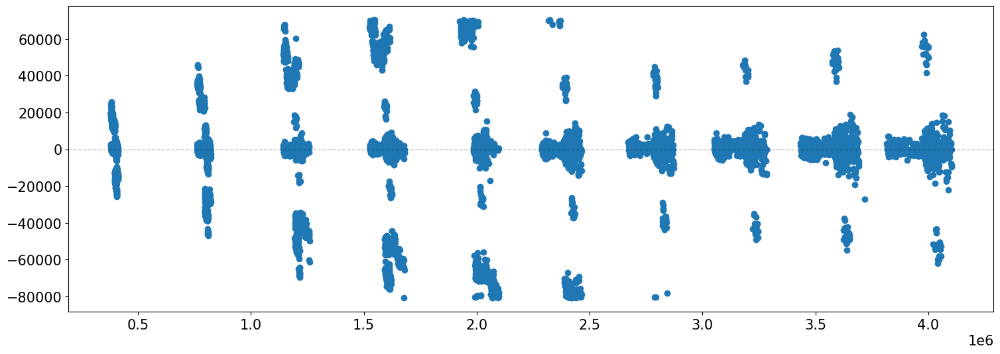

In [47]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13248_R03_S12_2023-08-03T14:19:34_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( outdir + "data_13248_R03_S12_2023-08-03T14:35:22_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             #outdir + "data_13248_R03_S12_2023-08-03T14:51:07_680nm_corrected.pkl", \
                             expstoremove=1)


xs_uncorrected, xs_corrected, ys_uncorrected, ys_corrected = plot_charge_cons(data_uncorrected, data_corrected,t0=15., xkey="base_CircularApertureFlux_25_0_instFlux",ykey="base_CircularApertureFlux_25_0_instFlux", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/chargecons.png")

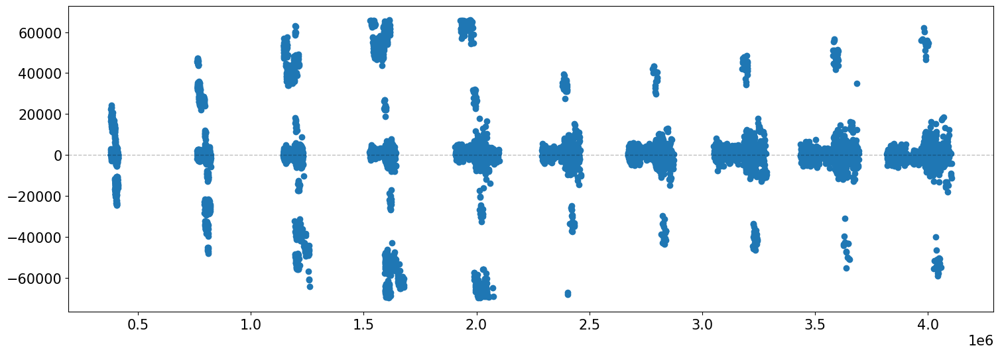

In [48]:
# Use sensor data
sensor = "R03_S12"
detector = 23

# Butler repository
outdir = "/sdf/home/a/abrought/run5/BF/data/2023-07-19-improvedbkgremoval/"

# Retrieve data
data_uncorrected = readData( outdir + "data_13248_R03_S12_2023-08-03T14:19:34_680nm_uncorrected.pkl", \
                             expstoremove=1)

data_corrected =   readData( #outdir + "data_13248_R03_S12_2023-08-03T14:35:22_680nm_corrected.fluxConservingBFCorrection.pkl", \
                             outdir + "data_13248_R03_S12_2023-08-03T14:51:07_680nm_corrected.pkl", \
                             expstoremove=1)


xs_uncorrected2, xs_corrected2, ys_uncorrected2, ys_corrected2 = plot_charge_cons(data_uncorrected, data_corrected,t0=15., xkey="base_CircularApertureFlux_25_0_instFlux",ykey="base_CircularApertureFlux_25_0_instFlux", 
           fitrange=(15,50), figsize=(18,6),
           fontsize=15, sensor=sensor, detector=detector,
           xlabel=r"$f_{max}$, Max Signal [$e^{-}$]",
           ylabel="{}".format("$I_{xx} - I_{xx, 15s}$ (uncorrected) $[px^{2}]$"),
           ylabel2="{}".format("$I_{xx} - I_{xx, 15s}$ (corrected) $[px^{2}]$"),
           xlim=(0,2.0e5),
           ylim=(-0.15,0.5),
           saveto=f"../plots/{sensor}_ixx_covsample.png")

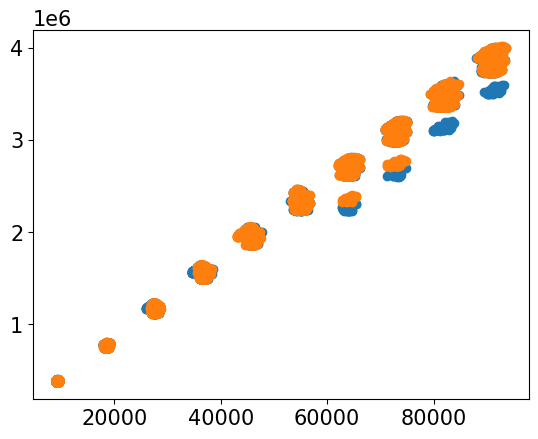

In [27]:
plt.scatter(xs_uncorrected, ys_corrected - ys_uncorrected)
plt.scatter(xs_uncorrected2, ys_corrected2 - ys_uncorrected2)
